# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: hfelsm5t
Name: still-vortex-612
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/hfelsm5t
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_014601-hfelsm5t/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 216,386,445,187,394,312,546,143,456,371,431,366,243,281,48,204,446,293,278,521,244,273,146,48,317,147,106,292,103,88,188,202,54,343,230,175,253,151,87,183,383,444,345,994,140,380,170,194,289,320,230,137,373,252,264,383,295,636,299,306,220,580,231,148,272,332,289,748,343,353,241,375,358,362,133,221,223,152,56,133,203,499,307,277,341,221,151,236,386,180,142,107,267,368,149,161,446,81,153,305,165,367,98,260,191,222,326,133,151,282,275,116,109,352,338,363,274,45,46,206,219,275,71,211,307,242,188,236,287,217,948,263,196,506,302,150,493,326,507,465,203,463,457,267,367,241,349,252,294,281,280,246,256,393,389,257,235,198,151,609,255,241,145,150,173,161,524,259,379,221,272,409,596,394,301,250,225,223,169,181,211,188,206,249,624,361,327,362,380,7133,411,278,199,173,357,174,274,275,156,31

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 60,95,113,45,101,67,141,32,126,92,102,98,58,77,11,60,116,72,70,142,62,62,42,16,93,37,28,72,23,19,42,43,10,69,56,36,78,29,27,54,85,122,70,225,39,95,45,47,66,78,55,41,97,76,65,95,92,151,83,60,70,151,66,35,50,93,65,157,98,92,83,84,93,83,26,63,54,39,15,18,44,131,75,68,85,51,41,59,93,36,33,23,62,126,43,39,106,15,40,63,50,96,28,43,46,52,84,34,32,86,74,24,32,93,89,81,53,9,13,60,59,54,25,43,88,69,49,62,74,46,249,74,45,141,73,42,130,106,119,116,58,108,122,71,84,59,95,50,69,85,59,56,63,107,108,56,63,39,41,161,55,52,31,36,42,41,143,56,101,48,73,103,154,119,71,72,59,68,49,41,53,48,49,56,139,73,85,84,83,1774,119,71,46,38,89,43,57,57,44,84,28,73,65,74,63,117,60,50,80,27,14,39,57,66,25,51,67,88,47,50,72,83,60,61,74,52,69,64,54,67,77,108,47,67,15,47,36,143,121,125,97,78,85,61,207,92,22,55,61

Epoch 1/600:   0%|          | 1/600 [00:13<2:18:39, 13.89s/it]

Epoch 1/600:   0%|          | 1/600 [00:13<2:18:39, 13.89s/it, v_num=5t_1, total_loss_train=1.89e+3, kl_local_train=66.6]

Epoch 2/600:   0%|          | 1/600 [00:13<2:18:39, 13.89s/it, v_num=5t_1, total_loss_train=1.89e+3, kl_local_train=66.6]

Epoch 2/600:   0%|          | 2/600 [00:20<1:34:09,  9.45s/it, v_num=5t_1, total_loss_train=1.89e+3, kl_local_train=66.6]

Epoch 2/600:   0%|          | 2/600 [00:20<1:34:09,  9.45s/it, v_num=5t_1, total_loss_train=1.34e+3, kl_local_train=82.7]

Epoch 3/600:   0%|          | 2/600 [00:20<1:34:09,  9.45s/it, v_num=5t_1, total_loss_train=1.34e+3, kl_local_train=82.7]

Epoch 3/600:   0%|          | 3/600 [00:26<1:19:48,  8.02s/it, v_num=5t_1, total_loss_train=1.34e+3, kl_local_train=82.7]

Epoch 3/600:   0%|          | 3/600 [00:26<1:19:48,  8.02s/it, v_num=5t_1, total_loss_train=1.32e+3, kl_local_train=76.4]

Epoch 4/600:   0%|          | 3/600 [00:26<1:19:48,  8.02s/it, v_num=5t_1, total_loss_train=1.32e+3, kl_local_train=76.4]

Epoch 4/600:   1%|          | 4/600 [00:32<1:12:58,  7.35s/it, v_num=5t_1, total_loss_train=1.32e+3, kl_local_train=76.4]

Epoch 4/600:   1%|          | 4/600 [00:32<1:12:58,  7.35s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=60.5]

Epoch 5/600:   1%|          | 4/600 [00:32<1:12:58,  7.35s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=60.5]

Epoch 5/600:   1%|          | 5/600 [00:39<1:09:22,  7.00s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=60.5]

Epoch 5/600:   1%|          | 5/600 [00:39<1:09:22,  7.00s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=35.3]

Epoch 6/600:   1%|          | 5/600 [00:39<1:09:22,  7.00s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=35.3]

Epoch 6/600:   1%|          | 6/600 [00:45<1:07:05,  6.78s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=35.3]

Epoch 6/600:   1%|          | 6/600 [00:45<1:07:05,  6.78s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=33.6] 

Epoch 7/600:   1%|          | 6/600 [00:45<1:07:05,  6.78s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=33.6]

Epoch 7/600:   1%|          | 7/600 [00:51<1:05:42,  6.65s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=33.6]

Epoch 7/600:   1%|          | 7/600 [00:51<1:05:42,  6.65s/it, v_num=5t_1, total_loss_train=1.28e+3, kl_local_train=37.6]

Epoch 8/600:   1%|          | 7/600 [00:51<1:05:42,  6.65s/it, v_num=5t_1, total_loss_train=1.28e+3, kl_local_train=37.6]

Epoch 8/600:   1%|▏         | 8/600 [00:58<1:04:34,  6.54s/it, v_num=5t_1, total_loss_train=1.28e+3, kl_local_train=37.6]

Epoch 8/600:   1%|▏         | 8/600 [00:58<1:04:34,  6.54s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=44]  

Epoch 9/600:   1%|▏         | 8/600 [00:58<1:04:34,  6.54s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=44]

Epoch 9/600:   2%|▏         | 9/600 [01:04<1:03:46,  6.47s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=44]

Epoch 9/600:   2%|▏         | 9/600 [01:04<1:03:46,  6.47s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=62.6]

Epoch 10/600:   2%|▏         | 9/600 [01:04<1:03:46,  6.47s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=62.6]

Epoch 10/600:   2%|▏         | 10/600 [01:10<1:03:14,  6.43s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=62.6]

Epoch 10/600:   2%|▏         | 10/600 [01:10<1:03:14,  6.43s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=85.2]

Epoch 11/600:   2%|▏         | 10/600 [01:10<1:03:14,  6.43s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=85.2]

Epoch 11/600:   2%|▏         | 11/600 [01:17<1:02:54,  6.41s/it, v_num=5t_1, total_loss_train=1.29e+3, kl_local_train=85.2]

Epoch 11/600:   2%|▏         | 11/600 [01:17<1:02:54,  6.41s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=112]  

Epoch 12/600:   2%|▏         | 11/600 [01:17<1:02:54,  6.41s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=112]

Epoch 12/600:   2%|▏         | 12/600 [01:23<1:02:30,  6.38s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=112]

Epoch 12/600:   2%|▏         | 12/600 [01:23<1:02:30,  6.38s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=133]

Epoch 13/600:   2%|▏         | 12/600 [01:23<1:02:30,  6.38s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=133]

Epoch 13/600:   2%|▏         | 13/600 [01:29<1:02:12,  6.36s/it, v_num=5t_1, total_loss_train=1.3e+3, kl_local_train=133]

Epoch 13/600:   2%|▏         | 13/600 [01:29<1:02:12,  6.36s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=160]

Epoch 14/600:   2%|▏         | 13/600 [01:29<1:02:12,  6.36s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=160]

Epoch 14/600:   2%|▏         | 14/600 [01:36<1:02:00,  6.35s/it, v_num=5t_1, total_loss_train=1.31e+3, kl_local_train=160]

Epoch 14/600:   2%|▏         | 14/600 [01:36<1:02:00,  6.35s/it, v_num=5t_1, total_loss_train=1.32e+3, kl_local_train=169]

Epoch 15/600:   2%|▏         | 14/600 [01:36<1:02:00,  6.35s/it, v_num=5t_1, total_loss_train=1.32e+3, kl_local_train=169]

Epoch 15/600:   2%|▎         | 15/600 [01:42<1:01:53,  6.35s/it, v_num=5t_1, total_loss_train=1.32e+3, kl_local_train=169]

Epoch 15/600:   2%|▎         | 15/600 [01:42<1:01:53,  6.35s/it, v_num=5t_1, total_loss_train=1.33e+3, kl_local_train=127]

Epoch 16/600:   2%|▎         | 15/600 [01:42<1:01:53,  6.35s/it, v_num=5t_1, total_loss_train=1.33e+3, kl_local_train=127]

Epoch 16/600:   3%|▎         | 16/600 [01:48<1:01:44,  6.34s/it, v_num=5t_1, total_loss_train=1.33e+3, kl_local_train=127]

Epoch 16/600:   3%|▎         | 16/600 [01:48<1:01:44,  6.34s/it, v_num=5t_1, total_loss_train=1.33e+3, kl_local_train=110]

Epoch 17/600:   3%|▎         | 16/600 [01:48<1:01:44,  6.34s/it, v_num=5t_1, total_loss_train=1.33e+3, kl_local_train=110]

Epoch 17/600:   3%|▎         | 17/600 [01:55<1:01:37,  6.34s/it, v_num=5t_1, total_loss_train=1.33e+3, kl_local_train=110]

Epoch 17/600:   3%|▎         | 17/600 [01:55<1:01:37,  6.34s/it, v_num=5t_1, total_loss_train=1.34e+3, kl_local_train=143]

Epoch 18/600:   3%|▎         | 17/600 [01:55<1:01:37,  6.34s/it, v_num=5t_1, total_loss_train=1.34e+3, kl_local_train=143]

Epoch 18/600:   3%|▎         | 18/600 [02:01<1:01:32,  6.35s/it, v_num=5t_1, total_loss_train=1.34e+3, kl_local_train=143]

Epoch 18/600:   3%|▎         | 18/600 [02:01<1:01:32,  6.35s/it, v_num=5t_1, total_loss_train=1.35e+3, kl_local_train=160]

Epoch 19/600:   3%|▎         | 18/600 [02:01<1:01:32,  6.35s/it, v_num=5t_1, total_loss_train=1.35e+3, kl_local_train=160]

Epoch 19/600:   3%|▎         | 19/600 [02:07<1:01:29,  6.35s/it, v_num=5t_1, total_loss_train=1.35e+3, kl_local_train=160]

Epoch 19/600:   3%|▎         | 19/600 [02:07<1:01:29,  6.35s/it, v_num=5t_1, total_loss_train=1.35e+3, kl_local_train=187]

Epoch 20/600:   3%|▎         | 19/600 [02:07<1:01:29,  6.35s/it, v_num=5t_1, total_loss_train=1.35e+3, kl_local_train=187]

Epoch 20/600:   3%|▎         | 20/600 [02:14<1:01:29,  6.36s/it, v_num=5t_1, total_loss_train=1.35e+3, kl_local_train=187]

Epoch 20/600:   3%|▎         | 20/600 [02:14<1:01:29,  6.36s/it, v_num=5t_1, total_loss_train=1.36e+3, kl_local_train=209]

Epoch 21/600:   3%|▎         | 20/600 [02:14<1:01:29,  6.36s/it, v_num=5t_1, total_loss_train=1.36e+3, kl_local_train=209]

Epoch 21/600:   4%|▎         | 21/600 [02:20<1:01:23,  6.36s/it, v_num=5t_1, total_loss_train=1.36e+3, kl_local_train=209]

Epoch 21/600:   4%|▎         | 21/600 [02:20<1:01:23,  6.36s/it, v_num=5t_1, total_loss_train=1.37e+3, kl_local_train=224]

Epoch 22/600:   4%|▎         | 21/600 [02:20<1:01:23,  6.36s/it, v_num=5t_1, total_loss_train=1.37e+3, kl_local_train=224]

Epoch 22/600:   4%|▎         | 22/600 [02:27<1:01:16,  6.36s/it, v_num=5t_1, total_loss_train=1.37e+3, kl_local_train=224]

Epoch 22/600:   4%|▎         | 22/600 [02:27<1:01:16,  6.36s/it, v_num=5t_1, total_loss_train=1.37e+3, kl_local_train=183]

Epoch 23/600:   4%|▎         | 22/600 [02:27<1:01:16,  6.36s/it, v_num=5t_1, total_loss_train=1.37e+3, kl_local_train=183]

Epoch 23/600:   4%|▍         | 23/600 [02:33<1:01:04,  6.35s/it, v_num=5t_1, total_loss_train=1.37e+3, kl_local_train=183]

Epoch 23/600:   4%|▍         | 23/600 [02:33<1:01:04,  6.35s/it, v_num=5t_1, total_loss_train=1.38e+3, kl_local_train=174]

Epoch 24/600:   4%|▍         | 23/600 [02:33<1:01:04,  6.35s/it, v_num=5t_1, total_loss_train=1.38e+3, kl_local_train=174]

Epoch 24/600:   4%|▍         | 24/600 [02:39<1:00:57,  6.35s/it, v_num=5t_1, total_loss_train=1.38e+3, kl_local_train=174]

Epoch 24/600:   4%|▍         | 24/600 [02:39<1:00:57,  6.35s/it, v_num=5t_1, total_loss_train=1.39e+3, kl_local_train=177]

Epoch 25/600:   4%|▍         | 24/600 [02:39<1:00:57,  6.35s/it, v_num=5t_1, total_loss_train=1.39e+3, kl_local_train=177]

Epoch 25/600:   4%|▍         | 25/600 [02:46<1:00:48,  6.35s/it, v_num=5t_1, total_loss_train=1.39e+3, kl_local_train=177]

Epoch 25/600:   4%|▍         | 25/600 [02:46<1:00:48,  6.35s/it, v_num=5t_1, total_loss_train=1.4e+3, kl_local_train=198] 

Epoch 26/600:   4%|▍         | 25/600 [02:46<1:00:48,  6.35s/it, v_num=5t_1, total_loss_train=1.4e+3, kl_local_train=198]

Epoch 26/600:   4%|▍         | 26/600 [02:52<1:00:40,  6.34s/it, v_num=5t_1, total_loss_train=1.4e+3, kl_local_train=198]

Epoch 26/600:   4%|▍         | 26/600 [02:52<1:00:40,  6.34s/it, v_num=5t_1, total_loss_train=1.41e+3, kl_local_train=197]

Epoch 27/600:   4%|▍         | 26/600 [02:52<1:00:40,  6.34s/it, v_num=5t_1, total_loss_train=1.41e+3, kl_local_train=197]

Epoch 27/600:   4%|▍         | 27/600 [02:58<1:00:30,  6.34s/it, v_num=5t_1, total_loss_train=1.41e+3, kl_local_train=197]

Epoch 27/600:   4%|▍         | 27/600 [02:58<1:00:30,  6.34s/it, v_num=5t_1, total_loss_train=1.41e+3, kl_local_train=209]

Epoch 28/600:   4%|▍         | 27/600 [02:58<1:00:30,  6.34s/it, v_num=5t_1, total_loss_train=1.41e+3, kl_local_train=209]

Epoch 28/600:   5%|▍         | 28/600 [03:05<1:00:22,  6.33s/it, v_num=5t_1, total_loss_train=1.41e+3, kl_local_train=209]

Epoch 28/600:   5%|▍         | 28/600 [03:05<1:00:22,  6.33s/it, v_num=5t_1, total_loss_train=1.42e+3, kl_local_train=231]

Epoch 29/600:   5%|▍         | 28/600 [03:05<1:00:22,  6.33s/it, v_num=5t_1, total_loss_train=1.42e+3, kl_local_train=231]

Epoch 29/600:   5%|▍         | 29/600 [03:11<1:00:24,  6.35s/it, v_num=5t_1, total_loss_train=1.42e+3, kl_local_train=231]

Epoch 29/600:   5%|▍         | 29/600 [03:11<1:00:24,  6.35s/it, v_num=5t_1, total_loss_train=1.43e+3, kl_local_train=239]

Epoch 30/600:   5%|▍         | 29/600 [03:11<1:00:24,  6.35s/it, v_num=5t_1, total_loss_train=1.43e+3, kl_local_train=239]

Epoch 30/600:   5%|▌         | 30/600 [03:17<1:00:14,  6.34s/it, v_num=5t_1, total_loss_train=1.43e+3, kl_local_train=239]

Epoch 30/600:   5%|▌         | 30/600 [03:17<1:00:14,  6.34s/it, v_num=5t_1, total_loss_train=1.43e+3, kl_local_train=226]

Epoch 31/600:   5%|▌         | 30/600 [03:17<1:00:14,  6.34s/it, v_num=5t_1, total_loss_train=1.43e+3, kl_local_train=226]

Epoch 31/600:   5%|▌         | 31/600 [03:24<1:00:05,  6.34s/it, v_num=5t_1, total_loss_train=1.43e+3, kl_local_train=226]

Epoch 31/600:   5%|▌         | 31/600 [03:24<1:00:05,  6.34s/it, v_num=5t_1, total_loss_train=1.44e+3, kl_local_train=205]

Epoch 32/600:   5%|▌         | 31/600 [03:24<1:00:05,  6.34s/it, v_num=5t_1, total_loss_train=1.44e+3, kl_local_train=205]

Epoch 32/600:   5%|▌         | 32/600 [03:30<59:53,  6.33s/it, v_num=5t_1, total_loss_train=1.44e+3, kl_local_train=205]  

Epoch 32/600:   5%|▌         | 32/600 [03:30<59:53,  6.33s/it, v_num=5t_1, total_loss_train=1.45e+3, kl_local_train=206]

Epoch 33/600:   5%|▌         | 32/600 [03:30<59:53,  6.33s/it, v_num=5t_1, total_loss_train=1.45e+3, kl_local_train=206]

Epoch 33/600:   6%|▌         | 33/600 [03:36<59:44,  6.32s/it, v_num=5t_1, total_loss_train=1.45e+3, kl_local_train=206]

Epoch 33/600:   6%|▌         | 33/600 [03:36<59:44,  6.32s/it, v_num=5t_1, total_loss_train=1.46e+3, kl_local_train=212]

Epoch 34/600:   6%|▌         | 33/600 [03:36<59:44,  6.32s/it, v_num=5t_1, total_loss_train=1.46e+3, kl_local_train=212]

Epoch 34/600:   6%|▌         | 34/600 [03:43<59:37,  6.32s/it, v_num=5t_1, total_loss_train=1.46e+3, kl_local_train=212]

Epoch 34/600:   6%|▌         | 34/600 [03:43<59:37,  6.32s/it, v_num=5t_1, total_loss_train=1.46e+3, kl_local_train=226]

Epoch 35/600:   6%|▌         | 34/600 [03:43<59:37,  6.32s/it, v_num=5t_1, total_loss_train=1.46e+3, kl_local_train=226]

Epoch 35/600:   6%|▌         | 35/600 [03:49<59:34,  6.33s/it, v_num=5t_1, total_loss_train=1.46e+3, kl_local_train=226]

Epoch 35/600:   6%|▌         | 35/600 [03:49<59:34,  6.33s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=210]

Epoch 36/600:   6%|▌         | 35/600 [03:49<59:34,  6.33s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=210]

Epoch 36/600:   6%|▌         | 36/600 [03:55<59:24,  6.32s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=210]

Epoch 36/600:   6%|▌         | 36/600 [03:55<59:24,  6.32s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=235]

Epoch 37/600:   6%|▌         | 36/600 [03:55<59:24,  6.32s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=235]

Epoch 37/600:   6%|▌         | 37/600 [04:02<59:19,  6.32s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=235]

Epoch 37/600:   6%|▌         | 37/600 [04:02<59:19,  6.32s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=227]

Epoch 38/600:   6%|▌         | 37/600 [04:02<59:19,  6.32s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=227]

Epoch 38/600:   6%|▋         | 38/600 [04:08<59:09,  6.32s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=227]

Epoch 38/600:   6%|▋         | 38/600 [04:08<59:09,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=235] 

Epoch 39/600:   6%|▋         | 38/600 [04:08<59:09,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=235]

Epoch 39/600:   6%|▋         | 39/600 [04:14<59:05,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=235]

Epoch 39/600:   6%|▋         | 39/600 [04:14<59:05,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=244]

Epoch 40/600:   6%|▋         | 39/600 [04:14<59:05,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=244]

Epoch 40/600:   7%|▋         | 40/600 [04:20<58:57,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=244]

Epoch 40/600:   7%|▋         | 40/600 [04:20<58:57,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=254]

Epoch 41/600:   7%|▋         | 40/600 [04:20<58:57,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=254]

Epoch 41/600:   7%|▋         | 41/600 [04:27<58:50,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=254]

Epoch 41/600:   7%|▋         | 41/600 [04:27<58:50,  6.32s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=261]

Epoch 42/600:   7%|▋         | 41/600 [04:27<58:50,  6.32s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=261]

Epoch 42/600:   7%|▋         | 42/600 [04:33<58:42,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=261]

Epoch 42/600:   7%|▋         | 42/600 [04:33<58:42,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=242]

Epoch 43/600:   7%|▋         | 42/600 [04:33<58:42,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=242]

Epoch 43/600:   7%|▋         | 43/600 [04:39<58:35,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=242]

Epoch 43/600:   7%|▋         | 43/600 [04:39<58:35,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=244]

Epoch 44/600:   7%|▋         | 43/600 [04:39<58:35,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=244]

Epoch 44/600:   7%|▋         | 44/600 [04:46<58:45,  6.34s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=244]

Epoch 44/600:   7%|▋         | 44/600 [04:46<58:45,  6.34s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=266]

Epoch 45/600:   7%|▋         | 44/600 [04:46<58:45,  6.34s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=266]

Epoch 45/600:   8%|▊         | 45/600 [04:52<58:34,  6.33s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=266]

Epoch 45/600:   8%|▊         | 45/600 [04:52<58:34,  6.33s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=247]

Epoch 46/600:   8%|▊         | 45/600 [04:52<58:34,  6.33s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=247]

Epoch 46/600:   8%|▊         | 46/600 [04:58<58:22,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=247]

Epoch 46/600:   8%|▊         | 46/600 [04:58<58:22,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=253]

Epoch 47/600:   8%|▊         | 46/600 [04:58<58:22,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=253]

Epoch 47/600:   8%|▊         | 47/600 [05:05<58:16,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=253]

Epoch 47/600:   8%|▊         | 47/600 [05:05<58:16,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=244]

Epoch 48/600:   8%|▊         | 47/600 [05:05<58:16,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=244]

Epoch 48/600:   8%|▊         | 48/600 [05:11<58:32,  6.36s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=244]

Epoch 48/600:   8%|▊         | 48/600 [05:11<58:32,  6.36s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=226]

Epoch 49/600:   8%|▊         | 48/600 [05:11<58:32,  6.36s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=226]

Epoch 49/600:   8%|▊         | 49/600 [05:18<58:25,  6.36s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=226]

Epoch 49/600:   8%|▊         | 49/600 [05:18<58:25,  6.36s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=229]

Epoch 50/600:   8%|▊         | 49/600 [05:18<58:25,  6.36s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=229]

Epoch 50/600:   8%|▊         | 50/600 [05:24<58:12,  6.35s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=229]

Epoch 50/600:   8%|▊         | 50/600 [05:24<58:12,  6.35s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=249]

Epoch 51/600:   8%|▊         | 50/600 [05:24<58:12,  6.35s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=249]

Epoch 51/600:   8%|▊         | 51/600 [05:30<58:01,  6.34s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=249]

Epoch 51/600:   8%|▊         | 51/600 [05:30<58:01,  6.34s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=264]

Epoch 52/600:   8%|▊         | 51/600 [05:30<58:01,  6.34s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=264]

Epoch 52/600:   9%|▊         | 52/600 [05:37<57:50,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=264]

Epoch 52/600:   9%|▊         | 52/600 [05:37<57:50,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=271]

Epoch 53/600:   9%|▊         | 52/600 [05:37<57:50,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=271]

Epoch 53/600:   9%|▉         | 53/600 [05:43<57:43,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=271]

Epoch 53/600:   9%|▉         | 53/600 [05:43<57:43,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=283]

Epoch 54/600:   9%|▉         | 53/600 [05:43<57:43,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=283]

Epoch 54/600:   9%|▉         | 54/600 [05:49<57:35,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=283]

Epoch 54/600:   9%|▉         | 54/600 [05:49<57:35,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=280]

Epoch 55/600:   9%|▉         | 54/600 [05:49<57:35,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=280]

Epoch 55/600:   9%|▉         | 55/600 [05:55<57:30,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=280]

Epoch 55/600:   9%|▉         | 55/600 [05:55<57:30,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=265]

Epoch 56/600:   9%|▉         | 55/600 [05:56<57:30,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=265]

Epoch 56/600:   9%|▉         | 56/600 [06:02<57:24,  6.33s/it, v_num=5t_1, total_loss_train=1.59e+3, kl_local_train=265]

Epoch 56/600:   9%|▉         | 56/600 [06:02<57:24,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=231]

Epoch 57/600:   9%|▉         | 56/600 [06:02<57:24,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=231]

Epoch 57/600:  10%|▉         | 57/600 [06:08<57:15,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=231]

Epoch 57/600:  10%|▉         | 57/600 [06:08<57:15,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=215]

Epoch 58/600:  10%|▉         | 57/600 [06:08<57:15,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=215]

Epoch 58/600:  10%|▉         | 58/600 [06:14<57:09,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=215]

Epoch 58/600:  10%|▉         | 58/600 [06:14<57:09,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=208]

Epoch 59/600:  10%|▉         | 58/600 [06:14<57:09,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=208]

Epoch 59/600:  10%|▉         | 59/600 [06:21<57:06,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=208]

Epoch 59/600:  10%|▉         | 59/600 [06:21<57:06,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=210]

Epoch 60/600:  10%|▉         | 59/600 [06:21<57:06,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=210]

Epoch 60/600:  10%|█         | 60/600 [06:27<56:56,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=210]

Epoch 60/600:  10%|█         | 60/600 [06:27<56:56,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=214]

Epoch 61/600:  10%|█         | 60/600 [06:27<56:56,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=214]

Epoch 61/600:  10%|█         | 61/600 [06:33<56:52,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=214]

Epoch 61/600:  10%|█         | 61/600 [06:33<56:52,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=226]

Epoch 62/600:  10%|█         | 61/600 [06:33<56:52,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=226]

Epoch 62/600:  10%|█         | 62/600 [06:40<56:43,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=226]

Epoch 62/600:  10%|█         | 62/600 [06:40<56:43,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=253]

Epoch 63/600:  10%|█         | 62/600 [06:40<56:43,  6.33s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=253]

Epoch 63/600:  10%|█         | 63/600 [06:46<56:36,  6.32s/it, v_num=5t_1, total_loss_train=1.58e+3, kl_local_train=253]

Epoch 63/600:  10%|█         | 63/600 [06:46<56:36,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=231]

Epoch 64/600:  10%|█         | 63/600 [06:46<56:36,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=231]

Epoch 64/600:  11%|█         | 64/600 [06:52<56:28,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=231]

Epoch 64/600:  11%|█         | 64/600 [06:52<56:28,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=216]

Epoch 65/600:  11%|█         | 64/600 [06:52<56:28,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=216]

Epoch 65/600:  11%|█         | 65/600 [06:59<56:22,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=216]

Epoch 65/600:  11%|█         | 65/600 [06:59<56:22,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=218]

Epoch 66/600:  11%|█         | 65/600 [06:59<56:22,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=218]

Epoch 66/600:  11%|█         | 66/600 [07:05<56:15,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=218]

Epoch 66/600:  11%|█         | 66/600 [07:05<56:15,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=200]

Epoch 67/600:  11%|█         | 66/600 [07:05<56:15,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=200]

Epoch 67/600:  11%|█         | 67/600 [07:11<56:11,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=200]

Epoch 67/600:  11%|█         | 67/600 [07:11<56:11,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=205]

Epoch 68/600:  11%|█         | 67/600 [07:11<56:11,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=205]

Epoch 68/600:  11%|█▏        | 68/600 [07:18<56:08,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=205]

Epoch 68/600:  11%|█▏        | 68/600 [07:18<56:08,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=206]

Epoch 69/600:  11%|█▏        | 68/600 [07:18<56:08,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=206]

Epoch 69/600:  12%|█▏        | 69/600 [07:24<55:59,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=206]

Epoch 69/600:  12%|█▏        | 69/600 [07:24<55:59,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=211]

Epoch 70/600:  12%|█▏        | 69/600 [07:24<55:59,  6.33s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=211]

Epoch 70/600:  12%|█▏        | 70/600 [07:30<55:52,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=211]

Epoch 70/600:  12%|█▏        | 70/600 [07:30<55:52,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=203]

Epoch 71/600:  12%|█▏        | 70/600 [07:30<55:52,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=203]

Epoch 71/600:  12%|█▏        | 71/600 [07:37<55:43,  6.32s/it, v_num=5t_1, total_loss_train=1.57e+3, kl_local_train=203]

Epoch 71/600:  12%|█▏        | 71/600 [07:37<55:43,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 72/600:  12%|█▏        | 71/600 [07:37<55:43,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 72/600:  12%|█▏        | 72/600 [07:43<55:36,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 72/600:  12%|█▏        | 72/600 [07:43<55:36,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 73/600:  12%|█▏        | 72/600 [07:43<55:36,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 73/600:  12%|█▏        | 73/600 [07:49<55:31,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=204]

Epoch 73/600:  12%|█▏        | 73/600 [07:49<55:31,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=196]

Epoch 74/600:  12%|█▏        | 73/600 [07:49<55:31,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=196]

Epoch 74/600:  12%|█▏        | 74/600 [07:56<55:24,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=196]

Epoch 74/600:  12%|█▏        | 74/600 [07:56<55:24,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=188]

Epoch 75/600:  12%|█▏        | 74/600 [07:56<55:24,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=188]

Epoch 75/600:  12%|█▎        | 75/600 [08:02<55:19,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=188]

Epoch 75/600:  12%|█▎        | 75/600 [08:02<55:19,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=185]

Epoch 76/600:  12%|█▎        | 75/600 [08:02<55:19,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=185]

Epoch 76/600:  13%|█▎        | 76/600 [08:08<55:12,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=185]

Epoch 76/600:  13%|█▎        | 76/600 [08:08<55:12,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=176]

Epoch 77/600:  13%|█▎        | 76/600 [08:08<55:12,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=176]

Epoch 77/600:  13%|█▎        | 77/600 [08:15<55:05,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=176]

Epoch 77/600:  13%|█▎        | 77/600 [08:15<55:05,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=179]

Epoch 78/600:  13%|█▎        | 77/600 [08:15<55:05,  6.32s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=179]

Epoch 78/600:  13%|█▎        | 78/600 [08:21<55:01,  6.33s/it, v_num=5t_1, total_loss_train=1.56e+3, kl_local_train=179]

Epoch 78/600:  13%|█▎        | 78/600 [08:21<55:01,  6.33s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=168]

Epoch 79/600:  13%|█▎        | 78/600 [08:21<55:01,  6.33s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=168]

Epoch 79/600:  13%|█▎        | 79/600 [08:27<54:51,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=168]

Epoch 79/600:  13%|█▎        | 79/600 [08:27<54:51,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=166]

Epoch 80/600:  13%|█▎        | 79/600 [08:27<54:51,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=166]

Epoch 80/600:  13%|█▎        | 80/600 [08:34<54:46,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=166]

Epoch 80/600:  13%|█▎        | 80/600 [08:34<54:46,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 81/600:  13%|█▎        | 80/600 [08:34<54:46,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 81/600:  14%|█▎        | 81/600 [08:40<54:38,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 81/600:  14%|█▎        | 81/600 [08:40<54:38,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=163]

Epoch 82/600:  14%|█▎        | 81/600 [08:40<54:38,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=163]

Epoch 82/600:  14%|█▎        | 82/600 [08:46<54:35,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=163]

Epoch 82/600:  14%|█▎        | 82/600 [08:46<54:35,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 83/600:  14%|█▎        | 82/600 [08:46<54:35,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 83/600:  14%|█▍        | 83/600 [08:53<54:27,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 83/600:  14%|█▍        | 83/600 [08:53<54:27,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=173]

Epoch 84/600:  14%|█▍        | 83/600 [08:53<54:27,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=173]

Epoch 84/600:  14%|█▍        | 84/600 [08:59<54:17,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=173]

Epoch 84/600:  14%|█▍        | 84/600 [08:59<54:17,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=178]

Epoch 85/600:  14%|█▍        | 84/600 [08:59<54:17,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=178]

Epoch 85/600:  14%|█▍        | 85/600 [09:05<54:11,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=178]

Epoch 85/600:  14%|█▍        | 85/600 [09:05<54:11,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=179]

Epoch 86/600:  14%|█▍        | 85/600 [09:05<54:11,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=179]

Epoch 86/600:  14%|█▍        | 86/600 [09:11<54:06,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=179]

Epoch 86/600:  14%|█▍        | 86/600 [09:11<54:06,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=184]

Epoch 87/600:  14%|█▍        | 86/600 [09:11<54:06,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=184]

Epoch 87/600:  14%|█▍        | 87/600 [09:18<54:00,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=184]

Epoch 87/600:  14%|█▍        | 87/600 [09:18<54:00,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=176]

Epoch 88/600:  14%|█▍        | 87/600 [09:18<54:00,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=176]

Epoch 88/600:  15%|█▍        | 88/600 [09:24<53:54,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=176]

Epoch 88/600:  15%|█▍        | 88/600 [09:24<53:54,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=171]

Epoch 89/600:  15%|█▍        | 88/600 [09:24<53:54,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=171]

Epoch 89/600:  15%|█▍        | 89/600 [09:30<53:49,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=171]

Epoch 89/600:  15%|█▍        | 89/600 [09:30<53:49,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=170]

Epoch 90/600:  15%|█▍        | 89/600 [09:30<53:49,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=170]

Epoch 90/600:  15%|█▌        | 90/600 [09:37<53:39,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=170]

Epoch 90/600:  15%|█▌        | 90/600 [09:37<53:39,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 91/600:  15%|█▌        | 90/600 [09:37<53:39,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 91/600:  15%|█▌        | 91/600 [09:43<53:34,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=165]

Epoch 91/600:  15%|█▌        | 91/600 [09:43<53:34,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=161]

Epoch 92/600:  15%|█▌        | 91/600 [09:43<53:34,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=161]

Epoch 92/600:  15%|█▌        | 92/600 [09:49<53:26,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=161]

Epoch 92/600:  15%|█▌        | 92/600 [09:49<53:26,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=153]

Epoch 93/600:  15%|█▌        | 92/600 [09:49<53:26,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=153]

Epoch 93/600:  16%|█▌        | 93/600 [09:56<53:22,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=153]

Epoch 93/600:  16%|█▌        | 93/600 [09:56<53:22,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=146]

Epoch 94/600:  16%|█▌        | 93/600 [09:56<53:22,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=146]

Epoch 94/600:  16%|█▌        | 94/600 [10:02<53:14,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=146]

Epoch 94/600:  16%|█▌        | 94/600 [10:02<53:14,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=151]

Epoch 95/600:  16%|█▌        | 94/600 [10:02<53:14,  6.31s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=151]

Epoch 95/600:  16%|█▌        | 95/600 [10:08<53:11,  6.32s/it, v_num=5t_1, total_loss_train=1.55e+3, kl_local_train=151]

Epoch 95/600:  16%|█▌        | 95/600 [10:08<53:11,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=147]

Epoch 96/600:  16%|█▌        | 95/600 [10:08<53:11,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=147]

Epoch 96/600:  16%|█▌        | 96/600 [10:15<53:03,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=147]

Epoch 96/600:  16%|█▌        | 96/600 [10:15<53:03,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=149]

Epoch 97/600:  16%|█▌        | 96/600 [10:15<53:03,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=149]

Epoch 97/600:  16%|█▌        | 97/600 [10:21<53:05,  6.33s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=149]

Epoch 97/600:  16%|█▌        | 97/600 [10:21<53:05,  6.33s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=146]

Epoch 98/600:  16%|█▌        | 97/600 [10:21<53:05,  6.33s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=146]

Epoch 98/600:  16%|█▋        | 98/600 [10:27<52:57,  6.33s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=146]

Epoch 98/600:  16%|█▋        | 98/600 [10:27<52:57,  6.33s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=143]

Epoch 99/600:  16%|█▋        | 98/600 [10:27<52:57,  6.33s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=143]

Epoch 99/600:  16%|█▋        | 99/600 [10:34<52:47,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=143]

Epoch 99/600:  16%|█▋        | 99/600 [10:34<52:47,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=144]

Epoch 100/600:  16%|█▋        | 99/600 [10:34<52:47,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=144]

Epoch 100/600:  17%|█▋        | 100/600 [10:40<52:39,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=144]

Epoch 100/600:  17%|█▋        | 100/600 [10:40<52:39,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=149]

Epoch 101/600:  17%|█▋        | 100/600 [10:40<52:39,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=149]

Epoch 101/600:  17%|█▋        | 101/600 [10:46<52:34,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=149]

Epoch 101/600:  17%|█▋        | 101/600 [10:46<52:34,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=146]

Epoch 102/600:  17%|█▋        | 101/600 [10:46<52:34,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=146]

Epoch 102/600:  17%|█▋        | 102/600 [10:53<52:25,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=146]

Epoch 102/600:  17%|█▋        | 102/600 [10:53<52:25,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=145]

Epoch 103/600:  17%|█▋        | 102/600 [10:53<52:25,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=145]

Epoch 103/600:  17%|█▋        | 103/600 [10:59<52:18,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=145]

Epoch 103/600:  17%|█▋        | 103/600 [10:59<52:18,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=136]

Epoch 104/600:  17%|█▋        | 103/600 [10:59<52:18,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=136]

Epoch 104/600:  17%|█▋        | 104/600 [11:05<52:15,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=136]

Epoch 104/600:  17%|█▋        | 104/600 [11:05<52:15,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=131]

Epoch 105/600:  17%|█▋        | 104/600 [11:05<52:15,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=131]

Epoch 105/600:  18%|█▊        | 105/600 [11:12<52:05,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=131]

Epoch 105/600:  18%|█▊        | 105/600 [11:12<52:05,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=134]

Epoch 106/600:  18%|█▊        | 105/600 [11:12<52:05,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=134]

Epoch 106/600:  18%|█▊        | 106/600 [11:18<52:02,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=134]

Epoch 106/600:  18%|█▊        | 106/600 [11:18<52:02,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=128]

Epoch 107/600:  18%|█▊        | 106/600 [11:18<52:02,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=128]

Epoch 107/600:  18%|█▊        | 107/600 [11:24<51:55,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=128]

Epoch 107/600:  18%|█▊        | 107/600 [11:24<51:55,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=133]

Epoch 108/600:  18%|█▊        | 107/600 [11:24<51:55,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=133]

Epoch 108/600:  18%|█▊        | 108/600 [11:30<51:47,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=133]

Epoch 108/600:  18%|█▊        | 108/600 [11:30<51:47,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=125]

Epoch 109/600:  18%|█▊        | 108/600 [11:30<51:47,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=125]

Epoch 109/600:  18%|█▊        | 109/600 [11:37<51:40,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=125]

Epoch 109/600:  18%|█▊        | 109/600 [11:37<51:40,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=129]

Epoch 110/600:  18%|█▊        | 109/600 [11:37<51:40,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=129]

Epoch 110/600:  18%|█▊        | 110/600 [11:43<51:33,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=129]

Epoch 110/600:  18%|█▊        | 110/600 [11:43<51:33,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=126]

Epoch 111/600:  18%|█▊        | 110/600 [11:43<51:33,  6.31s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=126]

Epoch 111/600:  18%|█▊        | 111/600 [11:49<51:32,  6.32s/it, v_num=5t_1, total_loss_train=1.54e+3, kl_local_train=126]

Epoch 111/600:  18%|█▊        | 111/600 [11:49<51:32,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=124]

Epoch 112/600:  18%|█▊        | 111/600 [11:49<51:32,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=124]

Epoch 112/600:  19%|█▊        | 112/600 [11:56<51:28,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=124]

Epoch 112/600:  19%|█▊        | 112/600 [11:56<51:28,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=121]

Epoch 113/600:  19%|█▊        | 112/600 [11:56<51:28,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=121]

Epoch 113/600:  19%|█▉        | 113/600 [12:02<51:20,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=121]

Epoch 113/600:  19%|█▉        | 113/600 [12:02<51:20,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=122]

Epoch 114/600:  19%|█▉        | 113/600 [12:02<51:20,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=122]

Epoch 114/600:  19%|█▉        | 114/600 [12:08<51:10,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=122]

Epoch 114/600:  19%|█▉        | 114/600 [12:08<51:10,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=115]

Epoch 115/600:  19%|█▉        | 114/600 [12:08<51:10,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=115]

Epoch 115/600:  19%|█▉        | 115/600 [12:15<51:03,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=115]

Epoch 115/600:  19%|█▉        | 115/600 [12:15<51:03,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 116/600:  19%|█▉        | 115/600 [12:15<51:03,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 116/600:  19%|█▉        | 116/600 [12:21<50:55,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 116/600:  19%|█▉        | 116/600 [12:21<50:55,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 117/600:  19%|█▉        | 116/600 [12:21<50:55,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 117/600:  20%|█▉        | 117/600 [12:27<50:52,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 117/600:  20%|█▉        | 117/600 [12:27<50:52,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=113]

Epoch 118/600:  20%|█▉        | 117/600 [12:27<50:52,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=113]

Epoch 118/600:  20%|█▉        | 118/600 [12:34<50:53,  6.34s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=113]

Epoch 118/600:  20%|█▉        | 118/600 [12:34<50:53,  6.34s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 119/600:  20%|█▉        | 118/600 [12:34<50:53,  6.34s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 119/600:  20%|█▉        | 119/600 [12:40<50:45,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=114]

Epoch 119/600:  20%|█▉        | 119/600 [12:40<50:45,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=110]

Epoch 120/600:  20%|█▉        | 119/600 [12:40<50:45,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=110]

Epoch 120/600:  20%|██        | 120/600 [12:46<50:35,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=110]

Epoch 120/600:  20%|██        | 120/600 [12:46<50:35,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 121/600:  20%|██        | 120/600 [12:46<50:35,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 121/600:  20%|██        | 121/600 [12:53<50:33,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 121/600:  20%|██        | 121/600 [12:53<50:33,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 122/600:  20%|██        | 121/600 [12:53<50:33,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 122/600:  20%|██        | 122/600 [12:59<50:22,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 122/600:  20%|██        | 122/600 [12:59<50:22,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 123/600:  20%|██        | 122/600 [12:59<50:22,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 123/600:  20%|██        | 123/600 [13:05<50:14,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 123/600:  20%|██        | 123/600 [13:05<50:14,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 124/600:  20%|██        | 123/600 [13:05<50:14,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 124/600:  21%|██        | 124/600 [13:12<50:06,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=111]

Epoch 124/600:  21%|██        | 124/600 [13:12<50:06,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=110]

Epoch 125/600:  21%|██        | 124/600 [13:12<50:06,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=110]

Epoch 125/600:  21%|██        | 125/600 [13:18<49:55,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=110]

Epoch 125/600:  21%|██        | 125/600 [13:18<49:55,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=117]

Epoch 126/600:  21%|██        | 125/600 [13:18<49:55,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=117]

Epoch 126/600:  21%|██        | 126/600 [13:24<49:57,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=117]

Epoch 126/600:  21%|██        | 126/600 [13:24<49:57,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=115]

Epoch 127/600:  21%|██        | 126/600 [13:24<49:57,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=115]

Epoch 127/600:  21%|██        | 127/600 [13:31<49:51,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=115]

Epoch 127/600:  21%|██        | 127/600 [13:31<49:51,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 128/600:  21%|██        | 127/600 [13:31<49:51,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 128/600:  21%|██▏       | 128/600 [13:37<49:56,  6.35s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 128/600:  21%|██▏       | 128/600 [13:37<49:56,  6.35s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 129/600:  21%|██▏       | 128/600 [13:37<49:56,  6.35s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 129/600:  22%|██▏       | 129/600 [13:43<49:49,  6.35s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 129/600:  22%|██▏       | 129/600 [13:43<49:49,  6.35s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 130/600:  22%|██▏       | 129/600 [13:43<49:49,  6.35s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 130/600:  22%|██▏       | 130/600 [13:50<49:35,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 130/600:  22%|██▏       | 130/600 [13:50<49:35,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 131/600:  22%|██▏       | 130/600 [13:50<49:35,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 131/600:  22%|██▏       | 131/600 [13:56<49:21,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 131/600:  22%|██▏       | 131/600 [13:56<49:21,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=104]

Epoch 132/600:  22%|██▏       | 131/600 [13:56<49:21,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=104]

Epoch 132/600:  22%|██▏       | 132/600 [14:02<49:11,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=104]

Epoch 132/600:  22%|██▏       | 132/600 [14:02<49:11,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 133/600:  22%|██▏       | 132/600 [14:02<49:11,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 133/600:  22%|██▏       | 133/600 [14:09<49:18,  6.34s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=109]

Epoch 133/600:  22%|██▏       | 133/600 [14:09<49:18,  6.34s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 134/600:  22%|██▏       | 133/600 [14:09<49:18,  6.34s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 134/600:  22%|██▏       | 134/600 [14:15<49:05,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 134/600:  22%|██▏       | 134/600 [14:15<49:05,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 135/600:  22%|██▏       | 134/600 [14:15<49:05,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 135/600:  22%|██▎       | 135/600 [14:21<49:04,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 135/600:  22%|██▎       | 135/600 [14:21<49:04,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 136/600:  22%|██▎       | 135/600 [14:21<49:04,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 136/600:  23%|██▎       | 136/600 [14:28<48:55,  6.33s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=105]

Epoch 136/600:  23%|██▎       | 136/600 [14:28<48:55,  6.33s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=106]

Epoch 137/600:  23%|██▎       | 136/600 [14:28<48:55,  6.33s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=106]

Epoch 137/600:  23%|██▎       | 137/600 [14:34<48:45,  6.32s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=106]

Epoch 137/600:  23%|██▎       | 137/600 [14:34<48:45,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 138/600:  23%|██▎       | 137/600 [14:34<48:45,  6.32s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 138/600:  23%|██▎       | 138/600 [14:40<48:34,  6.31s/it, v_num=5t_1, total_loss_train=1.53e+3, kl_local_train=107]

Epoch 138/600:  23%|██▎       | 138/600 [14:40<48:34,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=100]

Epoch 139/600:  23%|██▎       | 138/600 [14:40<48:34,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=100]

Epoch 139/600:  23%|██▎       | 139/600 [14:46<48:28,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=100]

Epoch 139/600:  23%|██▎       | 139/600 [14:46<48:28,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=99.8]

Epoch 140/600:  23%|██▎       | 139/600 [14:46<48:28,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=99.8]

Epoch 140/600:  23%|██▎       | 140/600 [14:53<48:22,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=99.8]

Epoch 140/600:  23%|██▎       | 140/600 [14:53<48:22,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=97.6]

Epoch 141/600:  23%|██▎       | 140/600 [14:53<48:22,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=97.6]

Epoch 141/600:  24%|██▎       | 141/600 [14:59<48:12,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=97.6]

Epoch 141/600:  24%|██▎       | 141/600 [14:59<48:12,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=94.7]

Epoch 142/600:  24%|██▎       | 141/600 [14:59<48:12,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=94.7]

Epoch 142/600:  24%|██▎       | 142/600 [15:05<48:02,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=94.7]

Epoch 142/600:  24%|██▎       | 142/600 [15:05<48:02,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=95.5]

Epoch 143/600:  24%|██▎       | 142/600 [15:05<48:02,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=95.5]

Epoch 143/600:  24%|██▍       | 143/600 [15:12<47:54,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=95.5]

Epoch 143/600:  24%|██▍       | 143/600 [15:12<47:54,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=93.2]

Epoch 144/600:  24%|██▍       | 143/600 [15:12<47:54,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=93.2]

Epoch 144/600:  24%|██▍       | 144/600 [15:18<47:50,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=93.2]

Epoch 144/600:  24%|██▍       | 144/600 [15:18<47:50,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=95.7]

Epoch 145/600:  24%|██▍       | 144/600 [15:18<47:50,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=95.7]

Epoch 145/600:  24%|██▍       | 145/600 [15:24<47:41,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=95.7]

Epoch 145/600:  24%|██▍       | 145/600 [15:24<47:41,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=90.9]

Epoch 146/600:  24%|██▍       | 145/600 [15:24<47:41,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=90.9]

Epoch 146/600:  24%|██▍       | 146/600 [15:31<47:40,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=90.9]

Epoch 146/600:  24%|██▍       | 146/600 [15:31<47:40,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=92.1]

Epoch 147/600:  24%|██▍       | 146/600 [15:31<47:40,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=92.1]

Epoch 147/600:  24%|██▍       | 147/600 [15:37<47:34,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=92.1]

Epoch 147/600:  24%|██▍       | 147/600 [15:37<47:34,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=92.1]

Epoch 148/600:  24%|██▍       | 147/600 [15:37<47:34,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=92.1]

Epoch 148/600:  25%|██▍       | 148/600 [15:43<47:23,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=92.1]

Epoch 148/600:  25%|██▍       | 148/600 [15:43<47:23,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=90.4]

Epoch 149/600:  25%|██▍       | 148/600 [15:43<47:23,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=90.4]

Epoch 149/600:  25%|██▍       | 149/600 [15:49<47:21,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=90.4]

Epoch 149/600:  25%|██▍       | 149/600 [15:49<47:21,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=88.3]

Epoch 150/600:  25%|██▍       | 149/600 [15:49<47:21,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=88.3]

Epoch 150/600:  25%|██▌       | 150/600 [15:56<47:10,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=88.3]

Epoch 150/600:  25%|██▌       | 150/600 [15:56<47:10,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=88.4]

Epoch 151/600:  25%|██▌       | 150/600 [15:56<47:10,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=88.4]

Epoch 151/600:  25%|██▌       | 151/600 [16:02<47:01,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=88.4]

Epoch 151/600:  25%|██▌       | 151/600 [16:02<47:01,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=89.5]

Epoch 152/600:  25%|██▌       | 151/600 [16:02<47:01,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=89.5]

Epoch 152/600:  25%|██▌       | 152/600 [16:08<46:53,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=89.5]

Epoch 152/600:  25%|██▌       | 152/600 [16:08<46:53,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.8]

Epoch 153/600:  25%|██▌       | 152/600 [16:08<46:53,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.8]

Epoch 153/600:  26%|██▌       | 153/600 [16:15<46:46,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.8]

Epoch 153/600:  26%|██▌       | 153/600 [16:15<46:46,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.8]

Epoch 154/600:  26%|██▌       | 153/600 [16:15<46:46,  6.28s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.8]

Epoch 154/600:  26%|██▌       | 154/600 [16:21<46:50,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.8]

Epoch 154/600:  26%|██▌       | 154/600 [16:21<46:50,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.1]

Epoch 155/600:  26%|██▌       | 154/600 [16:21<46:50,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.1]

Epoch 155/600:  26%|██▌       | 155/600 [16:27<46:40,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.1]

Epoch 155/600:  26%|██▌       | 155/600 [16:27<46:40,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=83.9]

Epoch 156/600:  26%|██▌       | 155/600 [16:27<46:40,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=83.9]

Epoch 156/600:  26%|██▌       | 156/600 [16:33<46:32,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=83.9]

Epoch 156/600:  26%|██▌       | 156/600 [16:33<46:32,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.9]

Epoch 157/600:  26%|██▌       | 156/600 [16:33<46:32,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.9]

Epoch 157/600:  26%|██▌       | 157/600 [16:40<46:31,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.9]

Epoch 157/600:  26%|██▌       | 157/600 [16:40<46:31,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=89.7]

Epoch 158/600:  26%|██▌       | 157/600 [16:40<46:31,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=89.7]

Epoch 158/600:  26%|██▋       | 158/600 [16:46<46:23,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=89.7]

Epoch 158/600:  26%|██▋       | 158/600 [16:46<46:23,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.6]

Epoch 159/600:  26%|██▋       | 158/600 [16:46<46:23,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.6]

Epoch 159/600:  26%|██▋       | 159/600 [16:52<46:17,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.6]

Epoch 159/600:  26%|██▋       | 159/600 [16:52<46:17,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.2]

Epoch 160/600:  26%|██▋       | 159/600 [16:52<46:17,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.2]

Epoch 160/600:  27%|██▋       | 160/600 [16:59<46:12,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=86.2]

Epoch 160/600:  27%|██▋       | 160/600 [16:59<46:12,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=82]  

Epoch 161/600:  27%|██▋       | 160/600 [16:59<46:12,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=82]

Epoch 161/600:  27%|██▋       | 161/600 [17:05<46:00,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=82]

Epoch 161/600:  27%|██▋       | 161/600 [17:05<46:00,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=85.3]

Epoch 162/600:  27%|██▋       | 161/600 [17:05<46:00,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=85.3]

Epoch 162/600:  27%|██▋       | 162/600 [17:11<45:57,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=85.3]

Epoch 162/600:  27%|██▋       | 162/600 [17:11<45:57,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.4]

Epoch 163/600:  27%|██▋       | 162/600 [17:11<45:57,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.4]

Epoch 163/600:  27%|██▋       | 163/600 [17:18<45:49,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=84.4]

Epoch 163/600:  27%|██▋       | 163/600 [17:18<45:49,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=82.4]

Epoch 164/600:  27%|██▋       | 163/600 [17:18<45:49,  6.29s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=82.4]

Epoch 164/600:  27%|██▋       | 164/600 [17:24<45:48,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=82.4]

Epoch 164/600:  27%|██▋       | 164/600 [17:24<45:48,  6.30s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.4]

Epoch 165/600:  27%|██▋       | 164/600 [17:24<45:48,  6.30s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.4]

Epoch 165/600:  28%|██▊       | 165/600 [17:30<45:46,  6.31s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.4]

Epoch 165/600:  28%|██▊       | 165/600 [17:30<45:46,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=80]  

Epoch 166/600:  28%|██▊       | 165/600 [17:30<45:46,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=80]

Epoch 166/600:  28%|██▊       | 166/600 [17:36<45:35,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=80]

Epoch 166/600:  28%|██▊       | 166/600 [17:36<45:35,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=81.9]

Epoch 167/600:  28%|██▊       | 166/600 [17:36<45:35,  6.30s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=81.9]

Epoch 167/600:  28%|██▊       | 167/600 [17:43<45:34,  6.32s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=81.9]

Epoch 167/600:  28%|██▊       | 167/600 [17:43<45:34,  6.32s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=79.6]

Epoch 168/600:  28%|██▊       | 167/600 [17:43<45:34,  6.32s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=79.6]

Epoch 168/600:  28%|██▊       | 168/600 [17:49<45:26,  6.31s/it, v_num=5t_1, total_loss_train=1.52e+3, kl_local_train=79.6]

Epoch 168/600:  28%|██▊       | 168/600 [17:49<45:26,  6.31s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80]  

Epoch 169/600:  28%|██▊       | 168/600 [17:49<45:26,  6.31s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80]

Epoch 169/600:  28%|██▊       | 169/600 [17:55<45:29,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80]

Epoch 169/600:  28%|██▊       | 169/600 [17:55<45:29,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.8]

Epoch 170/600:  28%|██▊       | 169/600 [17:55<45:29,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.8]

Epoch 170/600:  28%|██▊       | 170/600 [18:02<45:22,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.8]

Epoch 170/600:  28%|██▊       | 170/600 [18:02<45:22,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.4]

Epoch 171/600:  28%|██▊       | 170/600 [18:02<45:22,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.4]

Epoch 171/600:  28%|██▊       | 171/600 [18:08<45:11,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.4]

Epoch 171/600:  28%|██▊       | 171/600 [18:08<45:11,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.2]

Epoch 172/600:  28%|██▊       | 171/600 [18:08<45:11,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.2]

Epoch 172/600:  29%|██▊       | 172/600 [18:14<45:04,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=79.2]

Epoch 172/600:  29%|██▊       | 172/600 [18:14<45:04,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=78.8]

Epoch 173/600:  29%|██▊       | 172/600 [18:14<45:04,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=78.8]

Epoch 173/600:  29%|██▉       | 173/600 [18:21<44:57,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=78.8]

Epoch 173/600:  29%|██▉       | 173/600 [18:21<44:57,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.9]

Epoch 174/600:  29%|██▉       | 173/600 [18:21<44:57,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.9]

Epoch 174/600:  29%|██▉       | 174/600 [18:27<44:51,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.9]

Epoch 174/600:  29%|██▉       | 174/600 [18:27<44:51,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.1]

Epoch 175/600:  29%|██▉       | 174/600 [18:27<44:51,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.1]

Epoch 175/600:  29%|██▉       | 175/600 [18:33<44:50,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.1]

Epoch 175/600:  29%|██▉       | 175/600 [18:33<44:50,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.2]

Epoch 176/600:  29%|██▉       | 175/600 [18:33<44:50,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.2]

Epoch 176/600:  29%|██▉       | 176/600 [18:40<45:00,  6.37s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=80.2]

Epoch 176/600:  29%|██▉       | 176/600 [18:40<45:00,  6.37s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=78.7]

Epoch 177/600:  29%|██▉       | 176/600 [18:40<45:00,  6.37s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=78.7]

Epoch 177/600:  30%|██▉       | 177/600 [18:46<44:51,  6.36s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=78.7]

Epoch 177/600:  30%|██▉       | 177/600 [18:46<44:51,  6.36s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=75.9]

Epoch 178/600:  30%|██▉       | 177/600 [18:46<44:51,  6.36s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=75.9]

Epoch 178/600:  30%|██▉       | 178/600 [18:53<44:41,  6.35s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=75.9]

Epoch 178/600:  30%|██▉       | 178/600 [18:53<44:41,  6.35s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.1]

Epoch 179/600:  30%|██▉       | 178/600 [18:53<44:41,  6.35s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.1]

Epoch 179/600:  30%|██▉       | 179/600 [18:59<44:28,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.1]

Epoch 179/600:  30%|██▉       | 179/600 [18:59<44:28,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=77.5]

Epoch 180/600:  30%|██▉       | 179/600 [18:59<44:28,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=77.5]

Epoch 180/600:  30%|███       | 180/600 [19:05<44:20,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=77.5]

Epoch 180/600:  30%|███       | 180/600 [19:05<44:20,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=77]  

Epoch 181/600:  30%|███       | 180/600 [19:05<44:20,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=77]

Epoch 181/600:  30%|███       | 181/600 [19:12<44:27,  6.37s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=77]

Epoch 181/600:  30%|███       | 181/600 [19:12<44:27,  6.37s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.5]

Epoch 182/600:  30%|███       | 181/600 [19:12<44:27,  6.37s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.5]

Epoch 182/600:  30%|███       | 182/600 [19:18<44:17,  6.36s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.5]

Epoch 182/600:  30%|███       | 182/600 [19:18<44:17,  6.36s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.3]

Epoch 183/600:  30%|███       | 182/600 [19:18<44:17,  6.36s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.3]

Epoch 183/600:  30%|███       | 183/600 [19:24<44:05,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.3]

Epoch 183/600:  30%|███       | 183/600 [19:24<44:05,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.2]

Epoch 184/600:  30%|███       | 183/600 [19:24<44:05,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.2]

Epoch 184/600:  31%|███       | 184/600 [19:31<43:57,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.2]

Epoch 184/600:  31%|███       | 184/600 [19:31<43:57,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.8]

Epoch 185/600:  31%|███       | 184/600 [19:31<43:57,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.8]

Epoch 185/600:  31%|███       | 185/600 [19:37<43:51,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.8]

Epoch 185/600:  31%|███       | 185/600 [19:37<43:51,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.7]

Epoch 186/600:  31%|███       | 185/600 [19:37<43:51,  6.34s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.7]

Epoch 186/600:  31%|███       | 186/600 [19:43<43:40,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.7]

Epoch 186/600:  31%|███       | 186/600 [19:43<43:40,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.8]

Epoch 187/600:  31%|███       | 186/600 [19:43<43:40,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.8]

Epoch 187/600:  31%|███       | 187/600 [19:50<43:30,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.8]

Epoch 187/600:  31%|███       | 187/600 [19:50<43:30,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.6]

Epoch 188/600:  31%|███       | 187/600 [19:50<43:30,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.6]

Epoch 188/600:  31%|███▏      | 188/600 [19:56<43:24,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=73.6]

Epoch 188/600:  31%|███▏      | 188/600 [19:56<43:24,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.7]

Epoch 189/600:  31%|███▏      | 188/600 [19:56<43:24,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.7]

Epoch 189/600:  32%|███▏      | 189/600 [20:02<43:19,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=72.7]

Epoch 189/600:  32%|███▏      | 189/600 [20:02<43:19,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.5]

Epoch 190/600:  32%|███▏      | 189/600 [20:02<43:19,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.5]

Epoch 190/600:  32%|███▏      | 190/600 [20:09<43:13,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.5]

Epoch 190/600:  32%|███▏      | 190/600 [20:09<43:13,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.6]

Epoch 191/600:  32%|███▏      | 190/600 [20:09<43:13,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.6]

Epoch 191/600:  32%|███▏      | 191/600 [20:15<43:05,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=76.6]

Epoch 191/600:  32%|███▏      | 191/600 [20:15<43:05,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.9]

Epoch 192/600:  32%|███▏      | 191/600 [20:15<43:05,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.9]

Epoch 192/600:  32%|███▏      | 192/600 [20:21<42:58,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=74.9]

Epoch 192/600:  32%|███▏      | 192/600 [20:21<42:58,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=71.5]

Epoch 193/600:  32%|███▏      | 192/600 [20:21<42:58,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=71.5]

Epoch 193/600:  32%|███▏      | 193/600 [20:27<42:52,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=71.5]

Epoch 193/600:  32%|███▏      | 193/600 [20:27<42:52,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70]  

Epoch 194/600:  32%|███▏      | 193/600 [20:27<42:52,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70]

Epoch 194/600:  32%|███▏      | 194/600 [20:34<42:46,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70]

Epoch 194/600:  32%|███▏      | 194/600 [20:34<42:46,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.5]

Epoch 195/600:  32%|███▏      | 194/600 [20:34<42:46,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.5]

Epoch 195/600:  32%|███▎      | 195/600 [20:40<42:39,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.5]

Epoch 195/600:  32%|███▎      | 195/600 [20:40<42:39,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.4]

Epoch 196/600:  32%|███▎      | 195/600 [20:40<42:39,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.4]

Epoch 196/600:  33%|███▎      | 196/600 [20:46<42:33,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.4]

Epoch 196/600:  33%|███▎      | 196/600 [20:46<42:33,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.8]

Epoch 197/600:  33%|███▎      | 196/600 [20:46<42:33,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.8]

Epoch 197/600:  33%|███▎      | 197/600 [20:53<42:31,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.8]

Epoch 197/600:  33%|███▎      | 197/600 [20:53<42:31,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=69.6]

Epoch 198/600:  33%|███▎      | 197/600 [20:53<42:31,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=69.6]

Epoch 198/600:  33%|███▎      | 198/600 [20:59<42:25,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=69.6]

Epoch 198/600:  33%|███▎      | 198/600 [20:59<42:25,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=68.9]

Epoch 199/600:  33%|███▎      | 198/600 [20:59<42:25,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=68.9]

Epoch 199/600:  33%|███▎      | 199/600 [21:05<42:16,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=68.9]

Epoch 199/600:  33%|███▎      | 199/600 [21:05<42:16,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=66.5]

Epoch 200/600:  33%|███▎      | 199/600 [21:05<42:16,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=66.5]

Epoch 200/600:  33%|███▎      | 200/600 [21:12<42:08,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=66.5]

Epoch 200/600:  33%|███▎      | 200/600 [21:12<42:08,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.4] 

Epoch 201/600:  33%|███▎      | 200/600 [21:12<42:08,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.4]

Epoch 201/600:  34%|███▎      | 201/600 [21:18<42:01,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.4]

Epoch 201/600:  34%|███▎      | 201/600 [21:18<42:01,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=65.4]

Epoch 202/600:  34%|███▎      | 201/600 [21:18<42:01,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=65.4]

Epoch 202/600:  34%|███▎      | 202/600 [21:24<41:57,  6.33s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=65.4]

Epoch 202/600:  34%|███▎      | 202/600 [21:24<41:57,  6.33s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.4] 

Epoch 203/600:  34%|███▎      | 202/600 [21:24<41:57,  6.33s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.4]

Epoch 203/600:  34%|███▍      | 203/600 [21:31<41:50,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.4]

Epoch 203/600:  34%|███▍      | 203/600 [21:31<41:50,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=67.4]

Epoch 204/600:  34%|███▍      | 203/600 [21:31<41:50,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=67.4]

Epoch 204/600:  34%|███▍      | 204/600 [21:37<41:41,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=67.4]

Epoch 204/600:  34%|███▍      | 204/600 [21:37<41:41,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=68]  

Epoch 205/600:  34%|███▍      | 204/600 [21:37<41:41,  6.32s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=68]

Epoch 205/600:  34%|███▍      | 205/600 [21:43<41:33,  6.31s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=68]

Epoch 205/600:  34%|███▍      | 205/600 [21:43<41:33,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.1]

Epoch 206/600:  34%|███▍      | 205/600 [21:43<41:33,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.1]

Epoch 206/600:  34%|███▍      | 206/600 [21:50<41:26,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.1]

Epoch 206/600:  34%|███▍      | 206/600 [21:50<41:26,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.1]

Epoch 207/600:  34%|███▍      | 206/600 [21:50<41:26,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.1]

Epoch 207/600:  34%|███▍      | 207/600 [21:56<41:21,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.1]

Epoch 207/600:  34%|███▍      | 207/600 [21:56<41:21,  6.31s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.4]

Epoch 208/600:  34%|███▍      | 207/600 [21:56<41:21,  6.31s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.4]

Epoch 208/600:  35%|███▍      | 208/600 [22:02<41:13,  6.31s/it, v_num=5t_1, total_loss_train=1.51e+3, kl_local_train=70.4]

Epoch 208/600:  35%|███▍      | 208/600 [22:02<41:13,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=71.3] 

Epoch 209/600:  35%|███▍      | 208/600 [22:02<41:13,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=71.3]

Epoch 209/600:  35%|███▍      | 209/600 [22:09<41:06,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=71.3]

Epoch 209/600:  35%|███▍      | 209/600 [22:09<41:06,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=71]  

Epoch 210/600:  35%|███▍      | 209/600 [22:09<41:06,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=71]

Epoch 210/600:  35%|███▌      | 210/600 [22:15<41:01,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=71]

Epoch 210/600:  35%|███▌      | 210/600 [22:15<41:01,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.5]

Epoch 211/600:  35%|███▌      | 210/600 [22:15<41:01,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.5]

Epoch 211/600:  35%|███▌      | 211/600 [22:21<40:54,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=69.5]

Epoch 211/600:  35%|███▌      | 211/600 [22:21<40:54,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=67.1]

Epoch 212/600:  35%|███▌      | 211/600 [22:21<40:54,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=67.1]

Epoch 212/600:  35%|███▌      | 212/600 [22:28<40:49,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=67.1]

Epoch 212/600:  35%|███▌      | 212/600 [22:28<40:49,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 213/600:  35%|███▌      | 212/600 [22:28<40:49,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 213/600:  36%|███▌      | 213/600 [22:34<40:43,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 213/600:  36%|███▌      | 213/600 [22:34<40:43,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 214/600:  36%|███▌      | 213/600 [22:34<40:43,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 214/600:  36%|███▌      | 214/600 [22:40<40:35,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.7]

Epoch 214/600:  36%|███▌      | 214/600 [22:40<40:35,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=67.5]

Epoch 215/600:  36%|███▌      | 214/600 [22:40<40:35,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=67.5]

Epoch 215/600:  36%|███▌      | 215/600 [22:46<40:34,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=67.5]

Epoch 215/600:  36%|███▌      | 215/600 [22:46<40:34,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=68.7]

Epoch 216/600:  36%|███▌      | 215/600 [22:46<40:34,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=68.7]

Epoch 216/600:  36%|███▌      | 216/600 [22:53<40:29,  6.33s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=68.7]

Epoch 216/600:  36%|███▌      | 216/600 [22:53<40:29,  6.33s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.5]

Epoch 217/600:  36%|███▌      | 216/600 [22:53<40:29,  6.33s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.5]

Epoch 217/600:  36%|███▌      | 217/600 [22:59<40:19,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.5]

Epoch 217/600:  36%|███▌      | 217/600 [22:59<40:19,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.7]

Epoch 218/600:  36%|███▌      | 217/600 [22:59<40:19,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.7]

Epoch 218/600:  36%|███▋      | 218/600 [23:05<40:11,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.7]

Epoch 218/600:  36%|███▋      | 218/600 [23:05<40:11,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.8]

Epoch 219/600:  36%|███▋      | 218/600 [23:05<40:11,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.8]

Epoch 219/600:  36%|███▋      | 219/600 [23:12<40:04,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.8]

Epoch 219/600:  36%|███▋      | 219/600 [23:12<40:04,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.8]

Epoch 220/600:  36%|███▋      | 219/600 [23:12<40:04,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.8]

Epoch 220/600:  37%|███▋      | 220/600 [23:18<39:55,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.8]

Epoch 220/600:  37%|███▋      | 220/600 [23:18<39:55,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.8]

Epoch 221/600:  37%|███▋      | 220/600 [23:18<39:55,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.8]

Epoch 221/600:  37%|███▋      | 221/600 [23:24<39:47,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.8]

Epoch 221/600:  37%|███▋      | 221/600 [23:24<39:47,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.1]

Epoch 222/600:  37%|███▋      | 221/600 [23:24<39:47,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.1]

Epoch 222/600:  37%|███▋      | 222/600 [23:31<39:41,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.1]

Epoch 222/600:  37%|███▋      | 222/600 [23:31<39:41,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.9]

Epoch 223/600:  37%|███▋      | 222/600 [23:31<39:41,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.9]

Epoch 223/600:  37%|███▋      | 223/600 [23:37<39:37,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.9]

Epoch 223/600:  37%|███▋      | 223/600 [23:37<39:37,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.3]

Epoch 224/600:  37%|███▋      | 223/600 [23:37<39:37,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.3]

Epoch 224/600:  37%|███▋      | 224/600 [23:43<39:32,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=65.3]

Epoch 224/600:  37%|███▋      | 224/600 [23:43<39:32,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.3]

Epoch 225/600:  37%|███▋      | 224/600 [23:43<39:32,  6.31s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.3]

Epoch 225/600:  38%|███▊      | 225/600 [23:50<39:31,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.3]

Epoch 225/600:  38%|███▊      | 225/600 [23:50<39:31,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.1]

Epoch 226/600:  38%|███▊      | 225/600 [23:50<39:31,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.1]

Epoch 226/600:  38%|███▊      | 226/600 [23:56<39:23,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.1]

Epoch 226/600:  38%|███▊      | 226/600 [23:56<39:23,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.6]

Epoch 227/600:  38%|███▊      | 226/600 [23:56<39:23,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.6]

Epoch 227/600:  38%|███▊      | 227/600 [24:02<39:11,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.6]

Epoch 227/600:  38%|███▊      | 227/600 [24:02<39:11,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 228/600:  38%|███▊      | 227/600 [24:02<39:11,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 228/600:  38%|███▊      | 228/600 [24:08<39:02,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 228/600:  38%|███▊      | 228/600 [24:08<39:02,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.6]

Epoch 229/600:  38%|███▊      | 228/600 [24:08<39:02,  6.30s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.6]

Epoch 229/600:  38%|███▊      | 229/600 [24:15<39:04,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.6]

Epoch 229/600:  38%|███▊      | 229/600 [24:15<39:04,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.5]

Epoch 230/600:  38%|███▊      | 229/600 [24:15<39:04,  6.32s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.5]

Epoch 230/600:  38%|███▊      | 230/600 [24:21<38:49,  6.29s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=66.5]

Epoch 230/600:  38%|███▊      | 230/600 [24:21<38:49,  6.29s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.2]

Epoch 231/600:  38%|███▊      | 230/600 [24:21<38:49,  6.29s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.2]

Epoch 231/600:  38%|███▊      | 231/600 [24:27<38:38,  6.28s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.2]

Epoch 231/600:  38%|███▊      | 231/600 [24:27<38:38,  6.28s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 232/600:  38%|███▊      | 231/600 [24:27<38:38,  6.28s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 232/600:  39%|███▊      | 232/600 [24:34<38:25,  6.27s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 232/600:  39%|███▊      | 232/600 [24:34<38:25,  6.27s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 233/600:  39%|███▊      | 232/600 [24:34<38:25,  6.27s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 233/600:  39%|███▉      | 233/600 [24:40<38:14,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 233/600:  39%|███▉      | 233/600 [24:40<38:14,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.8]

Epoch 234/600:  39%|███▉      | 233/600 [24:40<38:14,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.8]

Epoch 234/600:  39%|███▉      | 234/600 [24:46<38:08,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.8]

Epoch 234/600:  39%|███▉      | 234/600 [24:46<38:08,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.9]

Epoch 235/600:  39%|███▉      | 234/600 [24:46<38:08,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.9]

Epoch 235/600:  39%|███▉      | 235/600 [24:52<38:00,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.9]

Epoch 235/600:  39%|███▉      | 235/600 [24:52<38:00,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.2]

Epoch 236/600:  39%|███▉      | 235/600 [24:52<38:00,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.2]

Epoch 236/600:  39%|███▉      | 236/600 [24:59<37:54,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.2]

Epoch 236/600:  39%|███▉      | 236/600 [24:59<37:54,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.5]

Epoch 237/600:  39%|███▉      | 236/600 [24:59<37:54,  6.25s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.5]

Epoch 237/600:  40%|███▉      | 237/600 [25:05<37:46,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.5]

Epoch 237/600:  40%|███▉      | 237/600 [25:05<37:46,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.7]

Epoch 238/600:  40%|███▉      | 237/600 [25:05<37:46,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.7]

Epoch 238/600:  40%|███▉      | 238/600 [25:11<37:39,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.7]

Epoch 238/600:  40%|███▉      | 238/600 [25:11<37:39,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.8]

Epoch 239/600:  40%|███▉      | 238/600 [25:11<37:39,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.8]

Epoch 239/600:  40%|███▉      | 239/600 [25:17<37:31,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.8]

Epoch 239/600:  40%|███▉      | 239/600 [25:17<37:31,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 240/600:  40%|███▉      | 239/600 [25:17<37:31,  6.24s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 240/600:  40%|████      | 240/600 [25:23<37:23,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 240/600:  40%|████      | 240/600 [25:23<37:23,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.5]

Epoch 241/600:  40%|████      | 240/600 [25:23<37:23,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.5]

Epoch 241/600:  40%|████      | 241/600 [25:30<37:15,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.5]

Epoch 241/600:  40%|████      | 241/600 [25:30<37:15,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.2]

Epoch 242/600:  40%|████      | 241/600 [25:30<37:15,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.2]

Epoch 242/600:  40%|████      | 242/600 [25:36<37:09,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=62.2]

Epoch 242/600:  40%|████      | 242/600 [25:36<37:09,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 243/600:  40%|████      | 242/600 [25:36<37:09,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 243/600:  40%|████      | 243/600 [25:42<37:03,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 243/600:  40%|████      | 243/600 [25:42<37:03,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.5]

Epoch 244/600:  40%|████      | 243/600 [25:42<37:03,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.5]

Epoch 244/600:  41%|████      | 244/600 [25:48<36:56,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.5]

Epoch 244/600:  41%|████      | 244/600 [25:48<36:56,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=59.5]

Epoch 245/600:  41%|████      | 244/600 [25:48<36:56,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=59.5]

Epoch 245/600:  41%|████      | 245/600 [25:55<36:49,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=59.5]

Epoch 245/600:  41%|████      | 245/600 [25:55<36:49,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60]  

Epoch 246/600:  41%|████      | 245/600 [25:55<36:49,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60]

Epoch 246/600:  41%|████      | 246/600 [26:01<36:45,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60]

Epoch 246/600:  41%|████      | 246/600 [26:01<36:45,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 247/600:  41%|████      | 246/600 [26:01<36:45,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 247/600:  41%|████      | 247/600 [26:07<36:38,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.6]

Epoch 247/600:  41%|████      | 247/600 [26:07<36:38,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 248/600:  41%|████      | 247/600 [26:07<36:38,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 248/600:  41%|████▏     | 248/600 [26:13<36:34,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=64.1]

Epoch 248/600:  41%|████▏     | 248/600 [26:13<36:34,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.5]

Epoch 249/600:  41%|████▏     | 248/600 [26:13<36:34,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.5]

Epoch 249/600:  42%|████▏     | 249/600 [26:19<36:26,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=63.5]

Epoch 249/600:  42%|████▏     | 249/600 [26:19<36:26,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.7]

Epoch 250/600:  42%|████▏     | 249/600 [26:19<36:26,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.7]

Epoch 250/600:  42%|████▏     | 250/600 [26:26<36:19,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.7]

Epoch 250/600:  42%|████▏     | 250/600 [26:26<36:19,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.7]

Epoch 251/600:  42%|████▏     | 250/600 [26:26<36:19,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.7]

Epoch 251/600:  42%|████▏     | 251/600 [26:32<36:12,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.7]

Epoch 251/600:  42%|████▏     | 251/600 [26:32<36:12,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.8]

Epoch 252/600:  42%|████▏     | 251/600 [26:32<36:12,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.8]

Epoch 252/600:  42%|████▏     | 252/600 [26:38<36:06,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.8]

Epoch 252/600:  42%|████▏     | 252/600 [26:38<36:06,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61]  

Epoch 253/600:  42%|████▏     | 252/600 [26:38<36:06,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61]

Epoch 253/600:  42%|████▏     | 253/600 [26:44<35:57,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61]

Epoch 253/600:  42%|████▏     | 253/600 [26:44<35:57,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=58.4]

Epoch 254/600:  42%|████▏     | 253/600 [26:44<35:57,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=58.4]

Epoch 254/600:  42%|████▏     | 254/600 [26:51<35:52,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=58.4]

Epoch 254/600:  42%|████▏     | 254/600 [26:51<35:52,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=58.4]

Epoch 255/600:  42%|████▏     | 254/600 [26:51<35:52,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=58.4]

Epoch 255/600:  42%|████▎     | 255/600 [26:57<35:45,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=58.4]

Epoch 255/600:  42%|████▎     | 255/600 [26:57<35:45,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.6]

Epoch 256/600:  42%|████▎     | 255/600 [26:57<35:45,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.6]

Epoch 256/600:  43%|████▎     | 256/600 [27:03<35:40,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.6]

Epoch 256/600:  43%|████▎     | 256/600 [27:03<35:40,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.3]

Epoch 257/600:  43%|████▎     | 256/600 [27:03<35:40,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.3]

Epoch 257/600:  43%|████▎     | 257/600 [27:09<35:34,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=61.3]

Epoch 257/600:  43%|████▎     | 257/600 [27:09<35:34,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 258/600:  43%|████▎     | 257/600 [27:09<35:34,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 258/600:  43%|████▎     | 258/600 [27:15<35:28,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 258/600:  43%|████▎     | 258/600 [27:15<35:28,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=59.2] 

Epoch 259/600:  43%|████▎     | 258/600 [27:15<35:28,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=59.2]

Epoch 259/600:  43%|████▎     | 259/600 [27:22<35:21,  6.22s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=59.2]

Epoch 259/600:  43%|████▎     | 259/600 [27:22<35:21,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 260/600:  43%|████▎     | 259/600 [27:22<35:21,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 260/600:  43%|████▎     | 260/600 [27:28<35:21,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 260/600:  43%|████▎     | 260/600 [27:28<35:21,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.3]

Epoch 261/600:  43%|████▎     | 260/600 [27:28<35:21,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.3]

Epoch 261/600:  44%|████▎     | 261/600 [27:34<35:13,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.3]

Epoch 261/600:  44%|████▎     | 261/600 [27:34<35:13,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.4] 

Epoch 262/600:  44%|████▎     | 261/600 [27:34<35:13,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.4]

Epoch 262/600:  44%|████▎     | 262/600 [27:40<35:05,  6.23s/it, v_num=5t_1, total_loss_train=1.5e+3, kl_local_train=60.4]

Epoch 262/600:  44%|████▎     | 262/600 [27:40<35:05,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 263/600:  44%|████▎     | 262/600 [27:40<35:05,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 263/600:  44%|████▍     | 263/600 [27:47<35:00,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 263/600:  44%|████▍     | 263/600 [27:47<35:00,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 264/600:  44%|████▍     | 263/600 [27:47<35:00,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 264/600:  44%|████▍     | 264/600 [27:53<34:57,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 264/600:  44%|████▍     | 264/600 [27:53<34:57,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.9]

Epoch 265/600:  44%|████▍     | 264/600 [27:53<34:57,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.9]

Epoch 265/600:  44%|████▍     | 265/600 [27:59<34:53,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.9]

Epoch 265/600:  44%|████▍     | 265/600 [27:59<34:53,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 266/600:  44%|████▍     | 265/600 [27:59<34:53,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 266/600:  44%|████▍     | 266/600 [28:05<34:45,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 266/600:  44%|████▍     | 266/600 [28:05<34:45,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.4]

Epoch 267/600:  44%|████▍     | 266/600 [28:05<34:45,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.4]

Epoch 267/600:  44%|████▍     | 267/600 [28:12<34:35,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.4]

Epoch 267/600:  44%|████▍     | 267/600 [28:12<34:35,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]  

Epoch 268/600:  44%|████▍     | 267/600 [28:12<34:35,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 268/600:  45%|████▍     | 268/600 [28:18<34:25,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 268/600:  45%|████▍     | 268/600 [28:18<34:25,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 269/600:  45%|████▍     | 268/600 [28:18<34:25,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 269/600:  45%|████▍     | 269/600 [28:24<34:16,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 269/600:  45%|████▍     | 269/600 [28:24<34:16,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 270/600:  45%|████▍     | 269/600 [28:24<34:16,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 270/600:  45%|████▌     | 270/600 [28:30<34:09,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.8]

Epoch 270/600:  45%|████▌     | 270/600 [28:30<34:09,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 271/600:  45%|████▌     | 270/600 [28:30<34:09,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 271/600:  45%|████▌     | 271/600 [28:36<34:03,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 271/600:  45%|████▌     | 271/600 [28:36<34:03,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.2]

Epoch 272/600:  45%|████▌     | 271/600 [28:36<34:03,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.2]

Epoch 272/600:  45%|████▌     | 272/600 [28:43<33:55,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.2]

Epoch 272/600:  45%|████▌     | 272/600 [28:43<33:55,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 273/600:  45%|████▌     | 272/600 [28:43<33:55,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 273/600:  46%|████▌     | 273/600 [28:49<33:52,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=59.7]

Epoch 273/600:  46%|████▌     | 273/600 [28:49<33:52,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.5]

Epoch 274/600:  46%|████▌     | 273/600 [28:49<33:52,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.5]

Epoch 274/600:  46%|████▌     | 274/600 [28:55<33:54,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.5]

Epoch 274/600:  46%|████▌     | 274/600 [28:55<33:54,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 275/600:  46%|████▌     | 274/600 [28:55<33:54,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 275/600:  46%|████▌     | 275/600 [29:01<33:48,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.9]

Epoch 275/600:  46%|████▌     | 275/600 [29:01<33:48,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.4]

Epoch 276/600:  46%|████▌     | 275/600 [29:01<33:48,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.4]

Epoch 276/600:  46%|████▌     | 276/600 [29:08<33:38,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.4]

Epoch 276/600:  46%|████▌     | 276/600 [29:08<33:38,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.6]

Epoch 277/600:  46%|████▌     | 276/600 [29:08<33:38,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.6]

Epoch 277/600:  46%|████▌     | 277/600 [29:14<33:30,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.6]

Epoch 277/600:  46%|████▌     | 277/600 [29:14<33:30,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]  

Epoch 278/600:  46%|████▌     | 277/600 [29:14<33:30,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 278/600:  46%|████▋     | 278/600 [29:20<33:33,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 278/600:  46%|████▋     | 278/600 [29:20<33:33,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.2]

Epoch 279/600:  46%|████▋     | 278/600 [29:20<33:33,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.2]

Epoch 279/600:  46%|████▋     | 279/600 [29:26<33:25,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.2]

Epoch 279/600:  46%|████▋     | 279/600 [29:26<33:25,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 280/600:  46%|████▋     | 279/600 [29:26<33:25,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 280/600:  47%|████▋     | 280/600 [29:33<33:13,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.5]

Epoch 280/600:  47%|████▋     | 280/600 [29:33<33:13,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.5]

Epoch 281/600:  47%|████▋     | 280/600 [29:33<33:13,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.5]

Epoch 281/600:  47%|████▋     | 281/600 [29:39<33:04,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.5]

Epoch 281/600:  47%|████▋     | 281/600 [29:39<33:04,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 282/600:  47%|████▋     | 281/600 [29:39<33:04,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 282/600:  47%|████▋     | 282/600 [29:45<32:56,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 282/600:  47%|████▋     | 282/600 [29:45<32:56,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 283/600:  47%|████▋     | 282/600 [29:45<32:56,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 283/600:  47%|████▋     | 283/600 [29:51<32:47,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 283/600:  47%|████▋     | 283/600 [29:51<32:47,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]  

Epoch 284/600:  47%|████▋     | 283/600 [29:51<32:47,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 284/600:  47%|████▋     | 284/600 [29:57<32:41,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 284/600:  47%|████▋     | 284/600 [29:57<32:41,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 285/600:  47%|████▋     | 284/600 [29:57<32:41,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 285/600:  48%|████▊     | 285/600 [30:04<32:35,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58]

Epoch 285/600:  48%|████▊     | 285/600 [30:04<32:35,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.4]

Epoch 286/600:  48%|████▊     | 285/600 [30:04<32:35,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.4]

Epoch 286/600:  48%|████▊     | 286/600 [30:10<32:30,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=58.4]

Epoch 286/600:  48%|████▊     | 286/600 [30:10<32:30,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 287/600:  48%|████▊     | 286/600 [30:10<32:30,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 287/600:  48%|████▊     | 287/600 [30:16<32:23,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57.8]

Epoch 287/600:  48%|████▊     | 287/600 [30:16<32:23,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 288/600:  48%|████▊     | 287/600 [30:16<32:23,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 288/600:  48%|████▊     | 288/600 [30:22<32:15,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 288/600:  48%|████▊     | 288/600 [30:22<32:15,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 289/600:  48%|████▊     | 288/600 [30:22<32:15,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 289/600:  48%|████▊     | 289/600 [30:28<32:10,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 289/600:  48%|████▊     | 289/600 [30:28<32:10,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 290/600:  48%|████▊     | 289/600 [30:28<32:10,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 290/600:  48%|████▊     | 290/600 [30:35<32:03,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 290/600:  48%|████▊     | 290/600 [30:35<32:03,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.7]

Epoch 291/600:  48%|████▊     | 290/600 [30:35<32:03,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.7]

Epoch 291/600:  48%|████▊     | 291/600 [30:41<31:57,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.7]

Epoch 291/600:  48%|████▊     | 291/600 [30:41<31:57,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.9]

Epoch 292/600:  48%|████▊     | 291/600 [30:41<31:57,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.9]

Epoch 292/600:  49%|████▊     | 292/600 [30:47<31:50,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.9]

Epoch 292/600:  49%|████▊     | 292/600 [30:47<31:50,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 293/600:  49%|████▊     | 292/600 [30:47<31:50,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 293/600:  49%|████▉     | 293/600 [30:53<31:44,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 293/600:  49%|████▉     | 293/600 [30:53<31:44,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 294/600:  49%|████▉     | 293/600 [30:53<31:44,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 294/600:  49%|████▉     | 294/600 [30:59<31:38,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 294/600:  49%|████▉     | 294/600 [30:59<31:38,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 295/600:  49%|████▉     | 294/600 [30:59<31:38,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 295/600:  49%|████▉     | 295/600 [31:06<31:31,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.3]

Epoch 295/600:  49%|████▉     | 295/600 [31:06<31:31,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 296/600:  49%|████▉     | 295/600 [31:06<31:31,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 296/600:  49%|████▉     | 296/600 [31:12<31:26,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 296/600:  49%|████▉     | 296/600 [31:12<31:26,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 297/600:  49%|████▉     | 296/600 [31:12<31:26,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 297/600:  50%|████▉     | 297/600 [31:18<31:17,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 297/600:  50%|████▉     | 297/600 [31:18<31:17,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.9]

Epoch 298/600:  50%|████▉     | 297/600 [31:18<31:17,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.9]

Epoch 298/600:  50%|████▉     | 298/600 [31:24<31:11,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.9]

Epoch 298/600:  50%|████▉     | 298/600 [31:24<31:11,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.5]

Epoch 299/600:  50%|████▉     | 298/600 [31:24<31:11,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.5]

Epoch 299/600:  50%|████▉     | 299/600 [31:30<31:06,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.5]

Epoch 299/600:  50%|████▉     | 299/600 [31:30<31:06,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 300/600:  50%|████▉     | 299/600 [31:30<31:06,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 300/600:  50%|█████     | 300/600 [31:37<30:58,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 300/600:  50%|█████     | 300/600 [31:37<30:58,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 301/600:  50%|█████     | 300/600 [31:37<30:58,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 301/600:  50%|█████     | 301/600 [31:43<30:53,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 301/600:  50%|█████     | 301/600 [31:43<30:53,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 302/600:  50%|█████     | 301/600 [31:43<30:53,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 302/600:  50%|█████     | 302/600 [31:49<30:48,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 302/600:  50%|█████     | 302/600 [31:49<30:48,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.4]

Epoch 303/600:  50%|█████     | 302/600 [31:49<30:48,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.4]

Epoch 303/600:  50%|█████     | 303/600 [31:55<30:40,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.4]

Epoch 303/600:  50%|█████     | 303/600 [31:55<30:40,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.4]

Epoch 304/600:  50%|█████     | 303/600 [31:55<30:40,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.4]

Epoch 304/600:  51%|█████     | 304/600 [32:01<30:42,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.4]

Epoch 304/600:  51%|█████     | 304/600 [32:01<30:42,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 305/600:  51%|█████     | 304/600 [32:01<30:42,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 305/600:  51%|█████     | 305/600 [32:08<30:33,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.1]

Epoch 305/600:  51%|█████     | 305/600 [32:08<30:33,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 306/600:  51%|█████     | 305/600 [32:08<30:33,  6.22s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 306/600:  51%|█████     | 306/600 [32:14<30:25,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 306/600:  51%|█████     | 306/600 [32:14<30:25,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 307/600:  51%|█████     | 306/600 [32:14<30:25,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 307/600:  51%|█████     | 307/600 [32:20<30:17,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.2]

Epoch 307/600:  51%|█████     | 307/600 [32:20<30:17,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 308/600:  51%|█████     | 307/600 [32:20<30:17,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 308/600:  51%|█████▏    | 308/600 [32:26<30:11,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=56.8]

Epoch 308/600:  51%|█████▏    | 308/600 [32:26<30:11,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.6]

Epoch 309/600:  51%|█████▏    | 308/600 [32:26<30:11,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.6]

Epoch 309/600:  52%|█████▏    | 309/600 [32:32<30:05,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.6]

Epoch 309/600:  52%|█████▏    | 309/600 [32:32<30:05,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.4]

Epoch 310/600:  52%|█████▏    | 309/600 [32:32<30:05,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.4]

Epoch 310/600:  52%|█████▏    | 310/600 [32:39<29:57,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.4]

Epoch 310/600:  52%|█████▏    | 310/600 [32:39<29:57,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.1]

Epoch 311/600:  52%|█████▏    | 310/600 [32:39<29:57,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.1]

Epoch 311/600:  52%|█████▏    | 311/600 [32:45<29:51,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.1]

Epoch 311/600:  52%|█████▏    | 311/600 [32:45<29:51,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.4]

Epoch 312/600:  52%|█████▏    | 311/600 [32:45<29:51,  6.20s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.4]

Epoch 312/600:  52%|█████▏    | 312/600 [32:51<29:47,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.4]

Epoch 312/600:  52%|█████▏    | 312/600 [32:51<29:47,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.5]

Epoch 313/600:  52%|█████▏    | 312/600 [32:51<29:47,  6.21s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.5]

Epoch 313/600:  52%|█████▏    | 313/600 [32:57<29:48,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.5]

Epoch 313/600:  52%|█████▏    | 313/600 [32:57<29:48,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.6]

Epoch 314/600:  52%|█████▏    | 313/600 [32:57<29:48,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.6]

Epoch 314/600:  52%|█████▏    | 314/600 [33:04<29:42,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.6]

Epoch 314/600:  52%|█████▏    | 314/600 [33:04<29:42,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.1]

Epoch 315/600:  52%|█████▏    | 314/600 [33:04<29:42,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.1]

Epoch 315/600:  52%|█████▎    | 315/600 [33:10<29:36,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.1]

Epoch 315/600:  52%|█████▎    | 315/600 [33:10<29:36,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 316/600:  52%|█████▎    | 315/600 [33:10<29:36,  6.23s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 316/600:  53%|█████▎    | 316/600 [33:16<29:33,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.3]

Epoch 316/600:  53%|█████▎    | 316/600 [33:16<29:33,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.9]

Epoch 317/600:  53%|█████▎    | 316/600 [33:16<29:33,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.9]

Epoch 317/600:  53%|█████▎    | 317/600 [33:22<29:27,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.9]

Epoch 317/600:  53%|█████▎    | 317/600 [33:22<29:27,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.5]

Epoch 318/600:  53%|█████▎    | 317/600 [33:22<29:27,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.5]

Epoch 318/600:  53%|█████▎    | 318/600 [33:29<29:21,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.5]

Epoch 318/600:  53%|█████▎    | 318/600 [33:29<29:21,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54]  

Epoch 319/600:  53%|█████▎    | 318/600 [33:29<29:21,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54]

Epoch 319/600:  53%|█████▎    | 319/600 [33:35<29:14,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54]

Epoch 319/600:  53%|█████▎    | 319/600 [33:35<29:14,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 320/600:  53%|█████▎    | 319/600 [33:35<29:14,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 320/600:  53%|█████▎    | 320/600 [33:41<29:07,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 320/600:  53%|█████▎    | 320/600 [33:41<29:07,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 321/600:  53%|█████▎    | 320/600 [33:41<29:07,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 321/600:  54%|█████▎    | 321/600 [33:47<29:02,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 321/600:  54%|█████▎    | 321/600 [33:47<29:02,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.9]

Epoch 322/600:  54%|█████▎    | 321/600 [33:47<29:02,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.9]

Epoch 322/600:  54%|█████▎    | 322/600 [33:54<28:55,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.9]

Epoch 322/600:  54%|█████▎    | 322/600 [33:54<28:55,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.6]

Epoch 323/600:  54%|█████▎    | 322/600 [33:54<28:55,  6.24s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.6]

Epoch 323/600:  54%|█████▍    | 323/600 [34:00<28:59,  6.28s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=53.6]

Epoch 323/600:  54%|█████▍    | 323/600 [34:00<28:59,  6.28s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.9]

Epoch 324/600:  54%|█████▍    | 323/600 [34:00<28:59,  6.28s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.9]

Epoch 324/600:  54%|█████▍    | 324/600 [34:06<28:54,  6.28s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.9]

Epoch 324/600:  54%|█████▍    | 324/600 [34:06<28:54,  6.28s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 325/600:  54%|█████▍    | 324/600 [34:06<28:54,  6.28s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 325/600:  54%|█████▍    | 325/600 [34:12<28:44,  6.27s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.7]

Epoch 325/600:  54%|█████▍    | 325/600 [34:12<28:44,  6.27s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.8]

Epoch 326/600:  54%|█████▍    | 325/600 [34:12<28:44,  6.27s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.8]

Epoch 326/600:  54%|█████▍    | 326/600 [34:19<28:37,  6.27s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=54.8]

Epoch 326/600:  54%|█████▍    | 326/600 [34:19<28:37,  6.27s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.8]

Epoch 327/600:  54%|█████▍    | 326/600 [34:19<28:37,  6.27s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.8]

Epoch 327/600:  55%|█████▍    | 327/600 [34:25<28:40,  6.30s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.8]

Epoch 327/600:  55%|█████▍    | 327/600 [34:25<28:40,  6.30s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=55.1]

Epoch 328/600:  55%|█████▍    | 327/600 [34:25<28:40,  6.30s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=55.1]

Epoch 328/600:  55%|█████▍    | 328/600 [34:31<28:32,  6.30s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=55.1]

Epoch 328/600:  55%|█████▍    | 328/600 [34:31<28:32,  6.30s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=55]  

Epoch 329/600:  55%|█████▍    | 328/600 [34:31<28:32,  6.30s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=55]

Epoch 329/600:  55%|█████▍    | 329/600 [34:38<28:21,  6.28s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=55]

Epoch 329/600:  55%|█████▍    | 329/600 [34:38<28:21,  6.28s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57]

Epoch 330/600:  55%|█████▍    | 329/600 [34:38<28:21,  6.28s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57]

Epoch 330/600:  55%|█████▌    | 330/600 [34:44<28:10,  6.26s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=57]

Epoch 330/600:  55%|█████▌    | 330/600 [34:44<28:10,  6.26s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.1]

Epoch 331/600:  55%|█████▌    | 330/600 [34:44<28:10,  6.26s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.1]

Epoch 331/600:  55%|█████▌    | 331/600 [34:50<28:02,  6.25s/it, v_num=5t_1, total_loss_train=1.49e+3, kl_local_train=55.1]

Epoch 331/600:  55%|█████▌    | 331/600 [34:50<28:02,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 332/600:  55%|█████▌    | 331/600 [34:50<28:02,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 332/600:  55%|█████▌    | 332/600 [34:56<27:55,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 332/600:  55%|█████▌    | 332/600 [34:56<27:55,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.2]

Epoch 333/600:  55%|█████▌    | 332/600 [34:56<27:55,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.2]

Epoch 333/600:  56%|█████▌    | 333/600 [35:03<27:49,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.2]

Epoch 333/600:  56%|█████▌    | 333/600 [35:03<27:49,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54]  

Epoch 334/600:  56%|█████▌    | 333/600 [35:03<27:49,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54]

Epoch 334/600:  56%|█████▌    | 334/600 [35:09<27:41,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54]

Epoch 334/600:  56%|█████▌    | 334/600 [35:09<27:41,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 335/600:  56%|█████▌    | 334/600 [35:09<27:41,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 335/600:  56%|█████▌    | 335/600 [35:15<27:33,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.6]

Epoch 335/600:  56%|█████▌    | 335/600 [35:15<27:33,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 336/600:  56%|█████▌    | 335/600 [35:15<27:33,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 336/600:  56%|█████▌    | 336/600 [35:21<27:28,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 336/600:  56%|█████▌    | 336/600 [35:21<27:28,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.3]

Epoch 337/600:  56%|█████▌    | 336/600 [35:21<27:28,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.3]

Epoch 337/600:  56%|█████▌    | 337/600 [35:28<27:20,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.3]

Epoch 337/600:  56%|█████▌    | 337/600 [35:28<27:20,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 338/600:  56%|█████▌    | 337/600 [35:28<27:20,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 338/600:  56%|█████▋    | 338/600 [35:34<27:14,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 338/600:  56%|█████▋    | 338/600 [35:34<27:14,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 339/600:  56%|█████▋    | 338/600 [35:34<27:14,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 339/600:  56%|█████▋    | 339/600 [35:40<27:07,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 339/600:  56%|█████▋    | 339/600 [35:40<27:07,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 340/600:  56%|█████▋    | 339/600 [35:40<27:07,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 340/600:  57%|█████▋    | 340/600 [35:46<27:02,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 340/600:  57%|█████▋    | 340/600 [35:46<27:02,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.1]

Epoch 341/600:  57%|█████▋    | 340/600 [35:46<27:02,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.1]

Epoch 341/600:  57%|█████▋    | 341/600 [35:52<26:56,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.1]

Epoch 341/600:  57%|█████▋    | 341/600 [35:52<26:56,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 342/600:  57%|█████▋    | 341/600 [35:52<26:56,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 342/600:  57%|█████▋    | 342/600 [35:59<26:50,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 342/600:  57%|█████▋    | 342/600 [35:59<26:50,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.2]

Epoch 343/600:  57%|█████▋    | 342/600 [35:59<26:50,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.2]

Epoch 343/600:  57%|█████▋    | 343/600 [36:05<26:43,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.2]

Epoch 343/600:  57%|█████▋    | 343/600 [36:05<26:43,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 344/600:  57%|█████▋    | 343/600 [36:05<26:43,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 344/600:  57%|█████▋    | 344/600 [36:11<26:36,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=54.1]

Epoch 344/600:  57%|█████▋    | 344/600 [36:11<26:36,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 345/600:  57%|█████▋    | 344/600 [36:11<26:36,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 345/600:  57%|█████▊    | 345/600 [36:17<26:29,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 345/600:  57%|█████▊    | 345/600 [36:17<26:29,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 346/600:  57%|█████▊    | 345/600 [36:17<26:29,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 346/600:  58%|█████▊    | 346/600 [36:24<26:21,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 346/600:  58%|█████▊    | 346/600 [36:24<26:21,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 347/600:  58%|█████▊    | 346/600 [36:24<26:21,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 347/600:  58%|█████▊    | 347/600 [36:30<26:15,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 347/600:  58%|█████▊    | 347/600 [36:30<26:15,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 348/600:  58%|█████▊    | 347/600 [36:30<26:15,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 348/600:  58%|█████▊    | 348/600 [36:36<26:09,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 348/600:  58%|█████▊    | 348/600 [36:36<26:09,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.5]

Epoch 349/600:  58%|█████▊    | 348/600 [36:36<26:09,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.5]

Epoch 349/600:  58%|█████▊    | 349/600 [36:42<26:02,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.5]

Epoch 349/600:  58%|█████▊    | 349/600 [36:42<26:02,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 350/600:  58%|█████▊    | 349/600 [36:42<26:02,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 350/600:  58%|█████▊    | 350/600 [36:49<25:55,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.3]

Epoch 350/600:  58%|█████▊    | 350/600 [36:49<25:55,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.5]

Epoch 351/600:  58%|█████▊    | 350/600 [36:49<25:55,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.5]

Epoch 351/600:  58%|█████▊    | 351/600 [36:55<25:49,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.5]

Epoch 351/600:  58%|█████▊    | 351/600 [36:55<25:49,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 352/600:  58%|█████▊    | 351/600 [36:55<25:49,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 352/600:  59%|█████▊    | 352/600 [37:01<25:43,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 352/600:  59%|█████▊    | 352/600 [37:01<25:43,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 353/600:  59%|█████▊    | 352/600 [37:01<25:43,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 353/600:  59%|█████▉    | 353/600 [37:07<25:34,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 353/600:  59%|█████▉    | 353/600 [37:07<25:34,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.3]

Epoch 354/600:  59%|█████▉    | 353/600 [37:07<25:34,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.3]

Epoch 354/600:  59%|█████▉    | 354/600 [37:13<25:26,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.3]

Epoch 354/600:  59%|█████▉    | 354/600 [37:13<25:26,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53]  

Epoch 355/600:  59%|█████▉    | 354/600 [37:13<25:26,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53]

Epoch 355/600:  59%|█████▉    | 355/600 [37:20<25:21,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53]

Epoch 355/600:  59%|█████▉    | 355/600 [37:20<25:21,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 356/600:  59%|█████▉    | 355/600 [37:20<25:21,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 356/600:  59%|█████▉    | 356/600 [37:26<25:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=53.1]

Epoch 356/600:  59%|█████▉    | 356/600 [37:26<25:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.1]

Epoch 357/600:  59%|█████▉    | 356/600 [37:26<25:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.1]

Epoch 357/600:  60%|█████▉    | 357/600 [37:32<25:10,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.1]

Epoch 357/600:  60%|█████▉    | 357/600 [37:32<25:10,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 358/600:  60%|█████▉    | 357/600 [37:32<25:10,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 358/600:  60%|█████▉    | 358/600 [37:38<25:03,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 358/600:  60%|█████▉    | 358/600 [37:38<25:03,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 359/600:  60%|█████▉    | 358/600 [37:38<25:03,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 359/600:  60%|█████▉    | 359/600 [37:44<24:58,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 359/600:  60%|█████▉    | 359/600 [37:44<24:58,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 360/600:  60%|█████▉    | 359/600 [37:44<24:58,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 360/600:  60%|██████    | 360/600 [37:51<24:52,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.8]

Epoch 360/600:  60%|██████    | 360/600 [37:51<24:52,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.3]

Epoch 361/600:  60%|██████    | 360/600 [37:51<24:52,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.3]

Epoch 361/600:  60%|██████    | 361/600 [37:57<24:50,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.3]

Epoch 361/600:  60%|██████    | 361/600 [37:57<24:50,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 362/600:  60%|██████    | 361/600 [37:57<24:50,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 362/600:  60%|██████    | 362/600 [38:03<24:45,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 362/600:  60%|██████    | 362/600 [38:03<24:45,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 363/600:  60%|██████    | 362/600 [38:03<24:45,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 363/600:  60%|██████    | 363/600 [38:09<24:39,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 363/600:  60%|██████    | 363/600 [38:09<24:39,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52]  

Epoch 364/600:  60%|██████    | 363/600 [38:09<24:39,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52]

Epoch 364/600:  61%|██████    | 364/600 [38:16<24:32,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52]

Epoch 364/600:  61%|██████    | 364/600 [38:16<24:32,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52]

Epoch 365/600:  61%|██████    | 364/600 [38:16<24:32,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52]

Epoch 365/600:  61%|██████    | 365/600 [38:22<24:26,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52]

Epoch 365/600:  61%|██████    | 365/600 [38:22<24:26,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 366/600:  61%|██████    | 365/600 [38:22<24:26,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 366/600:  61%|██████    | 366/600 [38:28<24:19,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 366/600:  61%|██████    | 366/600 [38:28<24:19,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 367/600:  61%|██████    | 366/600 [38:28<24:19,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 367/600:  61%|██████    | 367/600 [38:34<24:15,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.7]

Epoch 367/600:  61%|██████    | 367/600 [38:34<24:15,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.2]

Epoch 368/600:  61%|██████    | 367/600 [38:34<24:15,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.2]

Epoch 368/600:  61%|██████▏   | 368/600 [38:41<24:08,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.2]

Epoch 368/600:  61%|██████▏   | 368/600 [38:41<24:08,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 369/600:  61%|██████▏   | 368/600 [38:41<24:08,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 369/600:  62%|██████▏   | 369/600 [38:47<24:01,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 369/600:  62%|██████▏   | 369/600 [38:47<24:01,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.3]

Epoch 370/600:  62%|██████▏   | 369/600 [38:47<24:01,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.3]

Epoch 370/600:  62%|██████▏   | 370/600 [38:53<23:55,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.3]

Epoch 370/600:  62%|██████▏   | 370/600 [38:53<23:55,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.2]

Epoch 371/600:  62%|██████▏   | 370/600 [38:53<23:55,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.2]

Epoch 371/600:  62%|██████▏   | 371/600 [38:59<23:50,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.2]

Epoch 371/600:  62%|██████▏   | 371/600 [38:59<23:50,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.2]

Epoch 372/600:  62%|██████▏   | 371/600 [38:59<23:50,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.2]

Epoch 372/600:  62%|██████▏   | 372/600 [39:06<23:50,  6.27s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.2]

Epoch 372/600:  62%|██████▏   | 372/600 [39:06<23:50,  6.27s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.4]

Epoch 373/600:  62%|██████▏   | 372/600 [39:06<23:50,  6.27s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.4]

Epoch 373/600:  62%|██████▏   | 373/600 [39:12<23:39,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.4]

Epoch 373/600:  62%|██████▏   | 373/600 [39:12<23:39,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 374/600:  62%|██████▏   | 373/600 [39:12<23:39,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 374/600:  62%|██████▏   | 374/600 [39:18<23:32,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.5]

Epoch 374/600:  62%|██████▏   | 374/600 [39:18<23:32,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 375/600:  62%|██████▏   | 374/600 [39:18<23:32,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 375/600:  62%|██████▎   | 375/600 [39:24<23:22,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 375/600:  62%|██████▎   | 375/600 [39:24<23:22,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]  

Epoch 376/600:  62%|██████▎   | 375/600 [39:24<23:22,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]

Epoch 376/600:  63%|██████▎   | 376/600 [39:31<23:24,  6.27s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]

Epoch 376/600:  63%|██████▎   | 376/600 [39:31<23:24,  6.27s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.9]

Epoch 377/600:  63%|██████▎   | 376/600 [39:31<23:24,  6.27s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.9]

Epoch 377/600:  63%|██████▎   | 377/600 [39:37<23:13,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.9]

Epoch 377/600:  63%|██████▎   | 377/600 [39:37<23:13,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]  

Epoch 378/600:  63%|██████▎   | 377/600 [39:37<23:13,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]

Epoch 378/600:  63%|██████▎   | 378/600 [39:43<23:03,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]

Epoch 378/600:  63%|██████▎   | 378/600 [39:43<23:03,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 379/600:  63%|██████▎   | 378/600 [39:43<23:03,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 379/600:  63%|██████▎   | 379/600 [39:49<22:55,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 379/600:  63%|██████▎   | 379/600 [39:49<22:55,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 380/600:  63%|██████▎   | 379/600 [39:49<22:55,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 380/600:  63%|██████▎   | 380/600 [39:55<22:46,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.8]

Epoch 380/600:  63%|██████▎   | 380/600 [39:55<22:46,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.7]

Epoch 381/600:  63%|██████▎   | 380/600 [39:56<22:46,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.7]

Epoch 381/600:  64%|██████▎   | 381/600 [40:02<22:41,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.7]

Epoch 381/600:  64%|██████▎   | 381/600 [40:02<22:41,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 382/600:  64%|██████▎   | 381/600 [40:02<22:41,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 382/600:  64%|██████▎   | 382/600 [40:08<22:34,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 382/600:  64%|██████▎   | 382/600 [40:08<22:34,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 383/600:  64%|██████▎   | 382/600 [40:08<22:34,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 383/600:  64%|██████▍   | 383/600 [40:14<22:26,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 383/600:  64%|██████▍   | 383/600 [40:14<22:26,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 384/600:  64%|██████▍   | 383/600 [40:14<22:26,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 384/600:  64%|██████▍   | 384/600 [40:20<22:19,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 384/600:  64%|██████▍   | 384/600 [40:20<22:19,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.4]

Epoch 385/600:  64%|██████▍   | 384/600 [40:20<22:19,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.4]

Epoch 385/600:  64%|██████▍   | 385/600 [40:27<22:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.4]

Epoch 385/600:  64%|██████▍   | 385/600 [40:27<22:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 386/600:  64%|██████▍   | 385/600 [40:27<22:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 386/600:  64%|██████▍   | 386/600 [40:33<22:07,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 386/600:  64%|██████▍   | 386/600 [40:33<22:07,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 387/600:  64%|██████▍   | 386/600 [40:33<22:07,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 387/600:  64%|██████▍   | 387/600 [40:39<22:00,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 387/600:  64%|██████▍   | 387/600 [40:39<22:00,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 388/600:  64%|██████▍   | 387/600 [40:39<22:00,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 388/600:  65%|██████▍   | 388/600 [40:45<21:53,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 388/600:  65%|██████▍   | 388/600 [40:45<21:53,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 389/600:  65%|██████▍   | 388/600 [40:45<21:53,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 389/600:  65%|██████▍   | 389/600 [40:51<21:47,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 389/600:  65%|██████▍   | 389/600 [40:51<21:47,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 390/600:  65%|██████▍   | 389/600 [40:51<21:47,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 390/600:  65%|██████▌   | 390/600 [40:58<21:41,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 390/600:  65%|██████▌   | 390/600 [40:58<21:41,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 391/600:  65%|██████▌   | 390/600 [40:58<21:41,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 391/600:  65%|██████▌   | 391/600 [41:04<21:36,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 391/600:  65%|██████▌   | 391/600 [41:04<21:36,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 392/600:  65%|██████▌   | 391/600 [41:04<21:36,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 392/600:  65%|██████▌   | 392/600 [41:10<21:29,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 392/600:  65%|██████▌   | 392/600 [41:10<21:29,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 393/600:  65%|██████▌   | 392/600 [41:10<21:29,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 393/600:  66%|██████▌   | 393/600 [41:16<21:23,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 393/600:  66%|██████▌   | 393/600 [41:16<21:23,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.7]

Epoch 394/600:  66%|██████▌   | 393/600 [41:16<21:23,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.7]

Epoch 394/600:  66%|██████▌   | 394/600 [41:22<21:17,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.7]

Epoch 394/600:  66%|██████▌   | 394/600 [41:22<21:17,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 395/600:  66%|██████▌   | 394/600 [41:22<21:17,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 395/600:  66%|██████▌   | 395/600 [41:29<21:10,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=52.4]

Epoch 395/600:  66%|██████▌   | 395/600 [41:29<21:10,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 396/600:  66%|██████▌   | 395/600 [41:29<21:10,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 396/600:  66%|██████▌   | 396/600 [41:35<21:04,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.6]

Epoch 396/600:  66%|██████▌   | 396/600 [41:35<21:04,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]  

Epoch 397/600:  66%|██████▌   | 396/600 [41:35<21:04,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]

Epoch 397/600:  66%|██████▌   | 397/600 [41:41<20:58,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51]

Epoch 397/600:  66%|██████▌   | 397/600 [41:41<20:58,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 398/600:  66%|██████▌   | 397/600 [41:41<20:58,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 398/600:  66%|██████▋   | 398/600 [41:47<20:52,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=51.1]

Epoch 398/600:  66%|██████▋   | 398/600 [41:47<20:52,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 399/600:  66%|██████▋   | 398/600 [41:47<20:52,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 399/600:  66%|██████▋   | 399/600 [41:53<20:45,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 399/600:  66%|██████▋   | 399/600 [41:53<20:45,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 400/600:  66%|██████▋   | 399/600 [41:53<20:45,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 400/600:  67%|██████▋   | 400/600 [41:59<20:39,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.9]

Epoch 400/600:  67%|██████▋   | 400/600 [41:59<20:39,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 401/600:  67%|██████▋   | 400/600 [42:00<20:39,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 401/600:  67%|██████▋   | 401/600 [42:06<20:33,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 401/600:  67%|██████▋   | 401/600 [42:06<20:33,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 402/600:  67%|██████▋   | 401/600 [42:06<20:33,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 402/600:  67%|██████▋   | 402/600 [42:12<20:27,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 402/600:  67%|██████▋   | 402/600 [42:12<20:27,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 403/600:  67%|██████▋   | 402/600 [42:12<20:27,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 403/600:  67%|██████▋   | 403/600 [42:18<20:20,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 403/600:  67%|██████▋   | 403/600 [42:18<20:20,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 404/600:  67%|██████▋   | 403/600 [42:18<20:20,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 404/600:  67%|██████▋   | 404/600 [42:24<20:13,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.5]

Epoch 404/600:  67%|██████▋   | 404/600 [42:24<20:13,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 405/600:  67%|██████▋   | 404/600 [42:24<20:13,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 405/600:  68%|██████▊   | 405/600 [42:30<20:07,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 405/600:  68%|██████▊   | 405/600 [42:30<20:07,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.4]

Epoch 406/600:  68%|██████▊   | 405/600 [42:30<20:07,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.4]

Epoch 406/600:  68%|██████▊   | 406/600 [42:37<20:00,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.4]

Epoch 406/600:  68%|██████▊   | 406/600 [42:37<20:00,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 407/600:  68%|██████▊   | 406/600 [42:37<20:00,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 407/600:  68%|██████▊   | 407/600 [42:43<19:55,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 407/600:  68%|██████▊   | 407/600 [42:43<19:55,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 408/600:  68%|██████▊   | 407/600 [42:43<19:55,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 408/600:  68%|██████▊   | 408/600 [42:49<19:48,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 408/600:  68%|██████▊   | 408/600 [42:49<19:48,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 409/600:  68%|██████▊   | 408/600 [42:49<19:48,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 409/600:  68%|██████▊   | 409/600 [42:55<19:43,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 409/600:  68%|██████▊   | 409/600 [42:55<19:43,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.4]

Epoch 410/600:  68%|██████▊   | 409/600 [42:55<19:43,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.4]

Epoch 410/600:  68%|██████▊   | 410/600 [43:01<19:40,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.4]

Epoch 410/600:  68%|██████▊   | 410/600 [43:01<19:40,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 411/600:  68%|██████▊   | 410/600 [43:01<19:40,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 411/600:  68%|██████▊   | 411/600 [43:08<19:35,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 411/600:  68%|██████▊   | 411/600 [43:08<19:35,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 412/600:  68%|██████▊   | 411/600 [43:08<19:35,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 412/600:  69%|██████▊   | 412/600 [43:14<19:29,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.3]

Epoch 412/600:  69%|██████▊   | 412/600 [43:14<19:29,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 413/600:  69%|██████▊   | 412/600 [43:14<19:29,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 413/600:  69%|██████▉   | 413/600 [43:20<19:21,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 413/600:  69%|██████▉   | 413/600 [43:20<19:21,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 414/600:  69%|██████▉   | 413/600 [43:20<19:21,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 414/600:  69%|██████▉   | 414/600 [43:26<19:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.6]

Epoch 414/600:  69%|██████▉   | 414/600 [43:26<19:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 415/600:  69%|██████▉   | 414/600 [43:26<19:14,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 415/600:  69%|██████▉   | 415/600 [43:33<19:09,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.9]

Epoch 415/600:  69%|██████▉   | 415/600 [43:33<19:09,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 416/600:  69%|██████▉   | 415/600 [43:33<19:09,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 416/600:  69%|██████▉   | 416/600 [43:39<19:03,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 416/600:  69%|██████▉   | 416/600 [43:39<19:03,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 417/600:  69%|██████▉   | 416/600 [43:39<19:03,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 417/600:  70%|██████▉   | 417/600 [43:45<18:56,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 417/600:  70%|██████▉   | 417/600 [43:45<18:56,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.8]

Epoch 418/600:  70%|██████▉   | 417/600 [43:45<18:56,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.8]

Epoch 418/600:  70%|██████▉   | 418/600 [43:51<18:50,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.8]

Epoch 418/600:  70%|██████▉   | 418/600 [43:51<18:50,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 419/600:  70%|██████▉   | 418/600 [43:51<18:50,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 419/600:  70%|██████▉   | 419/600 [43:57<18:44,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.8]

Epoch 419/600:  70%|██████▉   | 419/600 [43:57<18:44,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 420/600:  70%|██████▉   | 419/600 [43:57<18:44,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 420/600:  70%|███████   | 420/600 [44:04<18:39,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 420/600:  70%|███████   | 420/600 [44:04<18:39,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49]  

Epoch 421/600:  70%|███████   | 420/600 [44:04<18:39,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49]

Epoch 421/600:  70%|███████   | 421/600 [44:10<18:37,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49]

Epoch 421/600:  70%|███████   | 421/600 [44:10<18:37,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 422/600:  70%|███████   | 421/600 [44:10<18:37,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 422/600:  70%|███████   | 422/600 [44:16<18:28,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 422/600:  70%|███████   | 422/600 [44:16<18:28,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 423/600:  70%|███████   | 422/600 [44:16<18:28,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 423/600:  70%|███████   | 423/600 [44:22<18:21,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 423/600:  70%|███████   | 423/600 [44:22<18:21,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 424/600:  70%|███████   | 423/600 [44:22<18:21,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 424/600:  71%|███████   | 424/600 [44:29<18:14,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.6]

Epoch 424/600:  71%|███████   | 424/600 [44:29<18:14,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 425/600:  71%|███████   | 424/600 [44:29<18:14,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 425/600:  71%|███████   | 425/600 [44:35<18:14,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 425/600:  71%|███████   | 425/600 [44:35<18:14,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.2]

Epoch 426/600:  71%|███████   | 425/600 [44:35<18:14,  6.25s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.2]

Epoch 426/600:  71%|███████   | 426/600 [44:41<18:06,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.2]

Epoch 426/600:  71%|███████   | 426/600 [44:41<18:06,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.9]

Epoch 427/600:  71%|███████   | 426/600 [44:41<18:06,  6.24s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.9]

Epoch 427/600:  71%|███████   | 427/600 [44:47<17:57,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.9]

Epoch 427/600:  71%|███████   | 427/600 [44:47<17:57,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.5]

Epoch 428/600:  71%|███████   | 427/600 [44:47<17:57,  6.23s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.5]

Epoch 428/600:  71%|███████▏  | 428/600 [44:54<17:49,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.5]

Epoch 428/600:  71%|███████▏  | 428/600 [44:54<17:49,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 429/600:  71%|███████▏  | 428/600 [44:54<17:49,  6.22s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 429/600:  72%|███████▏  | 429/600 [45:00<17:42,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 429/600:  72%|███████▏  | 429/600 [45:00<17:42,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 430/600:  72%|███████▏  | 429/600 [45:00<17:42,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 430/600:  72%|███████▏  | 430/600 [45:06<17:36,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 430/600:  72%|███████▏  | 430/600 [45:06<17:36,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49]  

Epoch 431/600:  72%|███████▏  | 430/600 [45:06<17:36,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49]

Epoch 431/600:  72%|███████▏  | 431/600 [45:12<17:29,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49]

Epoch 431/600:  72%|███████▏  | 431/600 [45:12<17:29,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.3]

Epoch 432/600:  72%|███████▏  | 431/600 [45:12<17:29,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.3]

Epoch 432/600:  72%|███████▏  | 432/600 [45:18<17:22,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.3]

Epoch 432/600:  72%|███████▏  | 432/600 [45:18<17:22,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 433/600:  72%|███████▏  | 432/600 [45:18<17:22,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 433/600:  72%|███████▏  | 433/600 [45:25<17:15,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 433/600:  72%|███████▏  | 433/600 [45:25<17:15,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 434/600:  72%|███████▏  | 433/600 [45:25<17:15,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 434/600:  72%|███████▏  | 434/600 [45:31<17:09,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.1]

Epoch 434/600:  72%|███████▏  | 434/600 [45:31<17:09,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.2]

Epoch 435/600:  72%|███████▏  | 434/600 [45:31<17:09,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.2]

Epoch 435/600:  72%|███████▎  | 435/600 [45:37<17:04,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=50.2]

Epoch 435/600:  72%|███████▎  | 435/600 [45:37<17:04,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 436/600:  72%|███████▎  | 435/600 [45:37<17:04,  6.21s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 436/600:  73%|███████▎  | 436/600 [45:43<16:56,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49.7]

Epoch 436/600:  73%|███████▎  | 436/600 [45:43<16:56,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 437/600:  73%|███████▎  | 436/600 [45:43<16:56,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 437/600:  73%|███████▎  | 437/600 [45:49<16:50,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 437/600:  73%|███████▎  | 437/600 [45:49<16:50,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.8]

Epoch 438/600:  73%|███████▎  | 437/600 [45:49<16:50,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.8]

Epoch 438/600:  73%|███████▎  | 438/600 [45:56<16:43,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.8]

Epoch 438/600:  73%|███████▎  | 438/600 [45:56<16:43,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49]  

Epoch 439/600:  73%|███████▎  | 438/600 [45:56<16:43,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49]

Epoch 439/600:  73%|███████▎  | 439/600 [46:02<16:37,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=49]

Epoch 439/600:  73%|███████▎  | 439/600 [46:02<16:37,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 440/600:  73%|███████▎  | 439/600 [46:02<16:37,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 440/600:  73%|███████▎  | 440/600 [46:08<16:31,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 440/600:  73%|███████▎  | 440/600 [46:08<16:31,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.7]

Epoch 441/600:  73%|███████▎  | 440/600 [46:08<16:31,  6.19s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.7]

Epoch 441/600:  74%|███████▎  | 441/600 [46:14<16:25,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.7]

Epoch 441/600:  74%|███████▎  | 441/600 [46:14<16:25,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 442/600:  74%|███████▎  | 441/600 [46:14<16:25,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 442/600:  74%|███████▎  | 442/600 [46:20<16:19,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 442/600:  74%|███████▎  | 442/600 [46:20<16:19,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 443/600:  74%|███████▎  | 442/600 [46:20<16:19,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 443/600:  74%|███████▍  | 443/600 [46:26<16:12,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.4]

Epoch 443/600:  74%|███████▍  | 443/600 [46:26<16:12,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 444/600:  74%|███████▍  | 443/600 [46:26<16:12,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 444/600:  74%|███████▍  | 444/600 [46:33<16:06,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 444/600:  74%|███████▍  | 444/600 [46:33<16:06,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49]  

Epoch 445/600:  74%|███████▍  | 444/600 [46:33<16:06,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49]

Epoch 445/600:  74%|███████▍  | 445/600 [46:39<16:00,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49]

Epoch 445/600:  74%|███████▍  | 445/600 [46:39<16:00,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 446/600:  74%|███████▍  | 445/600 [46:39<16:00,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 446/600:  74%|███████▍  | 446/600 [46:45<15:54,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 446/600:  74%|███████▍  | 446/600 [46:45<15:54,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 447/600:  74%|███████▍  | 446/600 [46:45<15:54,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 447/600:  74%|███████▍  | 447/600 [46:51<15:48,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 447/600:  74%|███████▍  | 447/600 [46:51<15:48,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.7]

Epoch 448/600:  74%|███████▍  | 447/600 [46:51<15:48,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.7]

Epoch 448/600:  75%|███████▍  | 448/600 [46:57<15:41,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.7]

Epoch 448/600:  75%|███████▍  | 448/600 [46:57<15:41,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 449/600:  75%|███████▍  | 448/600 [46:57<15:41,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 449/600:  75%|███████▍  | 449/600 [47:04<15:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 449/600:  75%|███████▍  | 449/600 [47:04<15:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 450/600:  75%|███████▍  | 449/600 [47:04<15:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 450/600:  75%|███████▌  | 450/600 [47:10<15:30,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 450/600:  75%|███████▌  | 450/600 [47:10<15:30,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.8]

Epoch 451/600:  75%|███████▌  | 450/600 [47:10<15:30,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.8]

Epoch 451/600:  75%|███████▌  | 451/600 [47:16<15:23,  6.20s/it, v_num=5t_1, total_loss_train=1.48e+3, kl_local_train=48.8]

Epoch 451/600:  75%|███████▌  | 451/600 [47:16<15:23,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 452/600:  75%|███████▌  | 451/600 [47:16<15:23,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 452/600:  75%|███████▌  | 452/600 [47:22<15:15,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 452/600:  75%|███████▌  | 452/600 [47:22<15:15,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 453/600:  75%|███████▌  | 452/600 [47:22<15:15,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 453/600:  76%|███████▌  | 453/600 [47:28<15:09,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 453/600:  76%|███████▌  | 453/600 [47:28<15:09,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 454/600:  76%|███████▌  | 453/600 [47:28<15:09,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 454/600:  76%|███████▌  | 454/600 [47:35<15:04,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 454/600:  76%|███████▌  | 454/600 [47:35<15:04,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 455/600:  76%|███████▌  | 454/600 [47:35<15:04,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 455/600:  76%|███████▌  | 455/600 [47:41<14:58,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 455/600:  76%|███████▌  | 455/600 [47:41<14:58,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 456/600:  76%|███████▌  | 455/600 [47:41<14:58,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 456/600:  76%|███████▌  | 456/600 [47:47<14:52,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 456/600:  76%|███████▌  | 456/600 [47:47<14:52,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.7]

Epoch 457/600:  76%|███████▌  | 456/600 [47:47<14:52,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.7]

Epoch 457/600:  76%|███████▌  | 457/600 [47:53<14:46,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.7]

Epoch 457/600:  76%|███████▌  | 457/600 [47:53<14:46,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 458/600:  76%|███████▌  | 457/600 [47:53<14:46,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 458/600:  76%|███████▋  | 458/600 [47:59<14:40,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 458/600:  76%|███████▋  | 458/600 [47:59<14:40,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 459/600:  76%|███████▋  | 458/600 [47:59<14:40,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 459/600:  76%|███████▋  | 459/600 [48:06<14:34,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 459/600:  76%|███████▋  | 459/600 [48:06<14:34,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 460/600:  76%|███████▋  | 459/600 [48:06<14:34,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 460/600:  77%|███████▋  | 460/600 [48:12<14:28,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.1]

Epoch 460/600:  77%|███████▋  | 460/600 [48:12<14:28,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 461/600:  77%|███████▋  | 460/600 [48:12<14:28,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 461/600:  77%|███████▋  | 461/600 [48:18<14:23,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 461/600:  77%|███████▋  | 461/600 [48:18<14:23,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 462/600:  77%|███████▋  | 461/600 [48:18<14:23,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 462/600:  77%|███████▋  | 462/600 [48:24<14:16,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 462/600:  77%|███████▋  | 462/600 [48:24<14:16,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 463/600:  77%|███████▋  | 462/600 [48:24<14:16,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 463/600:  77%|███████▋  | 463/600 [48:30<14:10,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 463/600:  77%|███████▋  | 463/600 [48:30<14:10,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 464/600:  77%|███████▋  | 463/600 [48:31<14:10,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 464/600:  77%|███████▋  | 464/600 [48:37<14:02,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.9]

Epoch 464/600:  77%|███████▋  | 464/600 [48:37<14:02,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 465/600:  77%|███████▋  | 464/600 [48:37<14:02,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 465/600:  78%|███████▊  | 465/600 [48:43<13:56,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=49.3]

Epoch 465/600:  78%|███████▊  | 465/600 [48:43<13:56,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 466/600:  78%|███████▊  | 465/600 [48:43<13:56,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 466/600:  78%|███████▊  | 466/600 [48:49<13:50,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 466/600:  78%|███████▊  | 466/600 [48:49<13:50,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 467/600:  78%|███████▊  | 466/600 [48:49<13:50,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 467/600:  78%|███████▊  | 467/600 [48:55<13:44,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.3]

Epoch 467/600:  78%|███████▊  | 467/600 [48:55<13:44,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 468/600:  78%|███████▊  | 467/600 [48:55<13:44,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 468/600:  78%|███████▊  | 468/600 [49:01<13:38,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 468/600:  78%|███████▊  | 468/600 [49:01<13:38,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 469/600:  78%|███████▊  | 468/600 [49:01<13:38,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 469/600:  78%|███████▊  | 469/600 [49:08<13:33,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.6]

Epoch 469/600:  78%|███████▊  | 469/600 [49:08<13:33,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 470/600:  78%|███████▊  | 469/600 [49:08<13:33,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 470/600:  78%|███████▊  | 470/600 [49:14<13:34,  6.27s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 470/600:  78%|███████▊  | 470/600 [49:14<13:34,  6.27s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 471/600:  78%|███████▊  | 470/600 [49:14<13:34,  6.27s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 471/600:  78%|███████▊  | 471/600 [49:20<13:26,  6.25s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 471/600:  78%|███████▊  | 471/600 [49:20<13:26,  6.25s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 472/600:  78%|███████▊  | 471/600 [49:20<13:26,  6.25s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 472/600:  79%|███████▊  | 472/600 [49:27<13:19,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 472/600:  79%|███████▊  | 472/600 [49:27<13:19,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 473/600:  79%|███████▊  | 472/600 [49:27<13:19,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 473/600:  79%|███████▉  | 473/600 [49:33<13:11,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 473/600:  79%|███████▉  | 473/600 [49:33<13:11,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 474/600:  79%|███████▉  | 473/600 [49:33<13:11,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 474/600:  79%|███████▉  | 474/600 [49:39<13:08,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 474/600:  79%|███████▉  | 474/600 [49:39<13:08,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 475/600:  79%|███████▉  | 474/600 [49:39<13:08,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 475/600:  79%|███████▉  | 475/600 [49:45<13:01,  6.25s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.5]

Epoch 475/600:  79%|███████▉  | 475/600 [49:45<13:01,  6.25s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.9]

Epoch 476/600:  79%|███████▉  | 475/600 [49:45<13:01,  6.25s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.9]

Epoch 476/600:  79%|███████▉  | 476/600 [49:52<12:53,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.9]

Epoch 476/600:  79%|███████▉  | 476/600 [49:52<12:53,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.9]

Epoch 477/600:  79%|███████▉  | 476/600 [49:52<12:53,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.9]

Epoch 477/600:  80%|███████▉  | 477/600 [49:58<12:45,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.9]

Epoch 477/600:  80%|███████▉  | 477/600 [49:58<12:45,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 478/600:  80%|███████▉  | 477/600 [49:58<12:45,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 478/600:  80%|███████▉  | 478/600 [50:04<12:40,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=48.4]

Epoch 478/600:  80%|███████▉  | 478/600 [50:04<12:40,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 479/600:  80%|███████▉  | 478/600 [50:04<12:40,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 479/600:  80%|███████▉  | 479/600 [50:10<12:33,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 479/600:  80%|███████▉  | 479/600 [50:10<12:33,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 480/600:  80%|███████▉  | 479/600 [50:10<12:33,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 480/600:  80%|████████  | 480/600 [50:16<12:26,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 480/600:  80%|████████  | 480/600 [50:16<12:26,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 481/600:  80%|████████  | 480/600 [50:16<12:26,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 481/600:  80%|████████  | 481/600 [50:23<12:19,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 481/600:  80%|████████  | 481/600 [50:23<12:19,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 482/600:  80%|████████  | 481/600 [50:23<12:19,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 482/600:  80%|████████  | 482/600 [50:29<12:13,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 482/600:  80%|████████  | 482/600 [50:29<12:13,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 483/600:  80%|████████  | 482/600 [50:29<12:13,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 483/600:  80%|████████  | 483/600 [50:35<12:07,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 483/600:  80%|████████  | 483/600 [50:35<12:07,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 484/600:  80%|████████  | 483/600 [50:35<12:07,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 484/600:  81%|████████  | 484/600 [50:41<12:01,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 484/600:  81%|████████  | 484/600 [50:41<12:01,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 485/600:  81%|████████  | 484/600 [50:41<12:01,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 485/600:  81%|████████  | 485/600 [50:47<11:54,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 485/600:  81%|████████  | 485/600 [50:47<11:54,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 486/600:  81%|████████  | 485/600 [50:47<11:54,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 486/600:  81%|████████  | 486/600 [50:54<11:48,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 486/600:  81%|████████  | 486/600 [50:54<11:48,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 487/600:  81%|████████  | 486/600 [50:54<11:48,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 487/600:  81%|████████  | 487/600 [51:00<11:43,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 487/600:  81%|████████  | 487/600 [51:00<11:43,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 488/600:  81%|████████  | 487/600 [51:00<11:43,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 488/600:  81%|████████▏ | 488/600 [51:06<11:37,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 488/600:  81%|████████▏ | 488/600 [51:06<11:37,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 489/600:  81%|████████▏ | 488/600 [51:06<11:37,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 489/600:  82%|████████▏ | 489/600 [51:12<11:31,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 489/600:  82%|████████▏ | 489/600 [51:12<11:31,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 490/600:  82%|████████▏ | 489/600 [51:12<11:31,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 490/600:  82%|████████▏ | 490/600 [51:19<11:24,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 490/600:  82%|████████▏ | 490/600 [51:19<11:24,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 491/600:  82%|████████▏ | 490/600 [51:19<11:24,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 491/600:  82%|████████▏ | 491/600 [51:25<11:17,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 491/600:  82%|████████▏ | 491/600 [51:25<11:17,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 492/600:  82%|████████▏ | 491/600 [51:25<11:17,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 492/600:  82%|████████▏ | 492/600 [51:31<11:10,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 492/600:  82%|████████▏ | 492/600 [51:31<11:10,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 493/600:  82%|████████▏ | 492/600 [51:31<11:10,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 493/600:  82%|████████▏ | 493/600 [51:37<11:03,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 493/600:  82%|████████▏ | 493/600 [51:37<11:03,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 494/600:  82%|████████▏ | 493/600 [51:37<11:03,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 494/600:  82%|████████▏ | 494/600 [51:43<10:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 494/600:  82%|████████▏ | 494/600 [51:43<10:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 495/600:  82%|████████▏ | 494/600 [51:43<10:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 495/600:  82%|████████▎ | 495/600 [51:50<10:51,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 495/600:  82%|████████▎ | 495/600 [51:50<10:51,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 496/600:  82%|████████▎ | 495/600 [51:50<10:51,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 496/600:  83%|████████▎ | 496/600 [51:56<10:45,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 496/600:  83%|████████▎ | 496/600 [51:56<10:45,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 497/600:  83%|████████▎ | 496/600 [51:56<10:45,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 497/600:  83%|████████▎ | 497/600 [52:02<10:39,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 497/600:  83%|████████▎ | 497/600 [52:02<10:39,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 498/600:  83%|████████▎ | 497/600 [52:02<10:39,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 498/600:  83%|████████▎ | 498/600 [52:08<10:34,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 498/600:  83%|████████▎ | 498/600 [52:08<10:34,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 499/600:  83%|████████▎ | 498/600 [52:08<10:34,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 499/600:  83%|████████▎ | 499/600 [52:14<10:28,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 499/600:  83%|████████▎ | 499/600 [52:14<10:28,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 500/600:  83%|████████▎ | 499/600 [52:15<10:28,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 500/600:  83%|████████▎ | 500/600 [52:21<10:21,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 500/600:  83%|████████▎ | 500/600 [52:21<10:21,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 501/600:  83%|████████▎ | 500/600 [52:21<10:21,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 501/600:  84%|████████▎ | 501/600 [52:27<10:15,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 501/600:  84%|████████▎ | 501/600 [52:27<10:15,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 502/600:  84%|████████▎ | 501/600 [52:27<10:15,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 502/600:  84%|████████▎ | 502/600 [52:33<10:09,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.5]

Epoch 502/600:  84%|████████▎ | 502/600 [52:33<10:09,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 503/600:  84%|████████▎ | 502/600 [52:33<10:09,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 503/600:  84%|████████▍ | 503/600 [52:39<10:03,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 503/600:  84%|████████▍ | 503/600 [52:39<10:03,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 504/600:  84%|████████▍ | 503/600 [52:39<10:03,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 504/600:  84%|████████▍ | 504/600 [52:46<09:57,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.6]

Epoch 504/600:  84%|████████▍ | 504/600 [52:46<09:57,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 505/600:  84%|████████▍ | 504/600 [52:46<09:57,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 505/600:  84%|████████▍ | 505/600 [52:52<09:50,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 505/600:  84%|████████▍ | 505/600 [52:52<09:50,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 506/600:  84%|████████▍ | 505/600 [52:52<09:50,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 506/600:  84%|████████▍ | 506/600 [52:58<09:44,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.7]

Epoch 506/600:  84%|████████▍ | 506/600 [52:58<09:44,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 507/600:  84%|████████▍ | 506/600 [52:58<09:44,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 507/600:  84%|████████▍ | 507/600 [53:04<09:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.4]

Epoch 507/600:  84%|████████▍ | 507/600 [53:04<09:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]  

Epoch 508/600:  84%|████████▍ | 507/600 [53:04<09:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 508/600:  85%|████████▍ | 508/600 [53:10<09:31,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 508/600:  85%|████████▍ | 508/600 [53:10<09:31,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 509/600:  85%|████████▍ | 508/600 [53:10<09:31,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 509/600:  85%|████████▍ | 509/600 [53:17<09:26,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 509/600:  85%|████████▍ | 509/600 [53:17<09:26,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 510/600:  85%|████████▍ | 509/600 [53:17<09:26,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 510/600:  85%|████████▌ | 510/600 [53:23<09:19,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.3]

Epoch 510/600:  85%|████████▌ | 510/600 [53:23<09:19,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]  

Epoch 511/600:  85%|████████▌ | 510/600 [53:23<09:19,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 511/600:  85%|████████▌ | 511/600 [53:29<09:15,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 511/600:  85%|████████▌ | 511/600 [53:29<09:15,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 512/600:  85%|████████▌ | 511/600 [53:29<09:15,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 512/600:  85%|████████▌ | 512/600 [53:35<09:08,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 512/600:  85%|████████▌ | 512/600 [53:35<09:08,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 513/600:  85%|████████▌ | 512/600 [53:35<09:08,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 513/600:  86%|████████▌ | 513/600 [53:42<09:02,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 513/600:  86%|████████▌ | 513/600 [53:42<09:02,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]  

Epoch 514/600:  86%|████████▌ | 513/600 [53:42<09:02,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 514/600:  86%|████████▌ | 514/600 [53:48<08:55,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 514/600:  86%|████████▌ | 514/600 [53:48<08:55,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 515/600:  86%|████████▌ | 514/600 [53:48<08:55,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 515/600:  86%|████████▌ | 515/600 [53:54<08:48,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 515/600:  86%|████████▌ | 515/600 [53:54<08:48,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 516/600:  86%|████████▌ | 515/600 [53:54<08:48,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 516/600:  86%|████████▌ | 516/600 [54:00<08:41,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 516/600:  86%|████████▌ | 516/600 [54:00<08:41,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 517/600:  86%|████████▌ | 516/600 [54:00<08:41,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 517/600:  86%|████████▌ | 517/600 [54:06<08:36,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 517/600:  86%|████████▌ | 517/600 [54:06<08:36,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 518/600:  86%|████████▌ | 517/600 [54:07<08:36,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 518/600:  86%|████████▋ | 518/600 [54:13<08:29,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 518/600:  86%|████████▋ | 518/600 [54:13<08:29,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 519/600:  86%|████████▋ | 518/600 [54:13<08:29,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 519/600:  86%|████████▋ | 519/600 [54:19<08:25,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 519/600:  86%|████████▋ | 519/600 [54:19<08:25,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]  

Epoch 520/600:  86%|████████▋ | 519/600 [54:19<08:25,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 520/600:  87%|████████▋ | 520/600 [54:25<08:17,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47]

Epoch 520/600:  87%|████████▋ | 520/600 [54:25<08:17,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 521/600:  87%|████████▋ | 520/600 [54:25<08:17,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 521/600:  87%|████████▋ | 521/600 [54:31<08:11,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.7]

Epoch 521/600:  87%|████████▋ | 521/600 [54:31<08:11,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 522/600:  87%|████████▋ | 521/600 [54:31<08:11,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 522/600:  87%|████████▋ | 522/600 [54:38<08:05,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 522/600:  87%|████████▋ | 522/600 [54:38<08:05,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 523/600:  87%|████████▋ | 522/600 [54:38<08:05,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 523/600:  87%|████████▋ | 523/600 [54:44<08:01,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=47.1]

Epoch 523/600:  87%|████████▋ | 523/600 [54:44<08:01,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 524/600:  87%|████████▋ | 523/600 [54:44<08:01,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 524/600:  87%|████████▋ | 524/600 [54:50<07:54,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 524/600:  87%|████████▋ | 524/600 [54:50<07:54,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 525/600:  87%|████████▋ | 524/600 [54:50<07:54,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 525/600:  88%|████████▊ | 525/600 [54:56<07:47,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 525/600:  88%|████████▊ | 525/600 [54:56<07:47,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 526/600:  88%|████████▊ | 525/600 [54:56<07:47,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 526/600:  88%|████████▊ | 526/600 [55:03<07:40,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 526/600:  88%|████████▊ | 526/600 [55:03<07:40,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 527/600:  88%|████████▊ | 526/600 [55:03<07:40,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 527/600:  88%|████████▊ | 527/600 [55:09<07:33,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.9]

Epoch 527/600:  88%|████████▊ | 527/600 [55:09<07:33,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 528/600:  88%|████████▊ | 527/600 [55:09<07:33,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 528/600:  88%|████████▊ | 528/600 [55:15<07:27,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.6]

Epoch 528/600:  88%|████████▊ | 528/600 [55:15<07:27,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 529/600:  88%|████████▊ | 528/600 [55:15<07:27,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 529/600:  88%|████████▊ | 529/600 [55:21<07:20,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 529/600:  88%|████████▊ | 529/600 [55:21<07:20,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 530/600:  88%|████████▊ | 529/600 [55:21<07:20,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 530/600:  88%|████████▊ | 530/600 [55:27<07:14,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 530/600:  88%|████████▊ | 530/600 [55:27<07:14,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46]  

Epoch 531/600:  88%|████████▊ | 530/600 [55:27<07:14,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46]

Epoch 531/600:  88%|████████▊ | 531/600 [55:34<07:07,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46]

Epoch 531/600:  88%|████████▊ | 531/600 [55:34<07:07,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 532/600:  88%|████████▊ | 531/600 [55:34<07:07,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 532/600:  89%|████████▊ | 532/600 [55:40<07:01,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 532/600:  89%|████████▊ | 532/600 [55:40<07:01,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.2]

Epoch 533/600:  89%|████████▊ | 532/600 [55:40<07:01,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.2]

Epoch 533/600:  89%|████████▉ | 533/600 [55:46<06:55,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.2]

Epoch 533/600:  89%|████████▉ | 533/600 [55:46<06:55,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 534/600:  89%|████████▉ | 533/600 [55:46<06:55,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 534/600:  89%|████████▉ | 534/600 [55:52<06:49,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 534/600:  89%|████████▉ | 534/600 [55:52<06:49,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 535/600:  89%|████████▉ | 534/600 [55:52<06:49,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 535/600:  89%|████████▉ | 535/600 [55:58<06:43,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 535/600:  89%|████████▉ | 535/600 [55:58<06:43,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 536/600:  89%|████████▉ | 535/600 [55:58<06:43,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 536/600:  89%|████████▉ | 536/600 [56:05<06:36,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 536/600:  89%|████████▉ | 536/600 [56:05<06:36,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 537/600:  89%|████████▉ | 536/600 [56:05<06:36,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 537/600:  90%|████████▉ | 537/600 [56:11<06:30,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 537/600:  90%|████████▉ | 537/600 [56:11<06:30,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 538/600:  90%|████████▉ | 537/600 [56:11<06:30,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 538/600:  90%|████████▉ | 538/600 [56:17<06:24,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 538/600:  90%|████████▉ | 538/600 [56:17<06:24,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 539/600:  90%|████████▉ | 538/600 [56:17<06:24,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 539/600:  90%|████████▉ | 539/600 [56:23<06:18,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.4]

Epoch 539/600:  90%|████████▉ | 539/600 [56:23<06:18,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 540/600:  90%|████████▉ | 539/600 [56:23<06:18,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 540/600:  90%|█████████ | 540/600 [56:29<06:10,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 540/600:  90%|█████████ | 540/600 [56:29<06:10,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 541/600:  90%|█████████ | 540/600 [56:29<06:10,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 541/600:  90%|█████████ | 541/600 [56:35<06:04,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 541/600:  90%|█████████ | 541/600 [56:35<06:04,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 542/600:  90%|█████████ | 541/600 [56:35<06:04,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 542/600:  90%|█████████ | 542/600 [56:42<05:59,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.5]

Epoch 542/600:  90%|█████████ | 542/600 [56:42<05:59,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 543/600:  90%|█████████ | 542/600 [56:42<05:59,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 543/600:  90%|█████████ | 543/600 [56:48<05:53,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.8]

Epoch 543/600:  90%|█████████ | 543/600 [56:48<05:53,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 544/600:  90%|█████████ | 543/600 [56:48<05:53,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 544/600:  91%|█████████ | 544/600 [56:54<05:47,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 544/600:  91%|█████████ | 544/600 [56:54<05:47,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 545/600:  91%|█████████ | 544/600 [56:54<05:47,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 545/600:  91%|█████████ | 545/600 [57:00<05:41,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 545/600:  91%|█████████ | 545/600 [57:00<05:41,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 546/600:  91%|█████████ | 545/600 [57:00<05:41,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 546/600:  91%|█████████ | 546/600 [57:07<05:34,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 546/600:  91%|█████████ | 546/600 [57:07<05:34,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 547/600:  91%|█████████ | 546/600 [57:07<05:34,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 547/600:  91%|█████████ | 547/600 [57:13<05:29,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 547/600:  91%|█████████ | 547/600 [57:13<05:29,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 548/600:  91%|█████████ | 547/600 [57:13<05:29,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 548/600:  91%|█████████▏| 548/600 [57:19<05:22,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 548/600:  91%|█████████▏| 548/600 [57:19<05:22,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 549/600:  91%|█████████▏| 548/600 [57:19<05:22,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 549/600:  92%|█████████▏| 549/600 [57:25<05:16,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.3]

Epoch 549/600:  92%|█████████▏| 549/600 [57:25<05:16,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 550/600:  92%|█████████▏| 549/600 [57:25<05:16,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 550/600:  92%|█████████▏| 550/600 [57:31<05:10,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 550/600:  92%|█████████▏| 550/600 [57:31<05:10,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 551/600:  92%|█████████▏| 550/600 [57:31<05:10,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 551/600:  92%|█████████▏| 551/600 [57:38<05:04,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 551/600:  92%|█████████▏| 551/600 [57:38<05:04,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 552/600:  92%|█████████▏| 551/600 [57:38<05:04,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 552/600:  92%|█████████▏| 552/600 [57:44<04:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 552/600:  92%|█████████▏| 552/600 [57:44<04:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 553/600:  92%|█████████▏| 552/600 [57:44<04:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 553/600:  92%|█████████▏| 553/600 [57:50<04:51,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 553/600:  92%|█████████▏| 553/600 [57:50<04:51,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 554/600:  92%|█████████▏| 553/600 [57:50<04:51,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 554/600:  92%|█████████▏| 554/600 [57:56<04:45,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 554/600:  92%|█████████▏| 554/600 [57:56<04:45,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 555/600:  92%|█████████▏| 554/600 [57:56<04:45,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 555/600:  92%|█████████▎| 555/600 [58:02<04:38,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 555/600:  92%|█████████▎| 555/600 [58:02<04:38,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 556/600:  92%|█████████▎| 555/600 [58:02<04:38,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 556/600:  93%|█████████▎| 556/600 [58:09<04:32,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=46.1]

Epoch 556/600:  93%|█████████▎| 556/600 [58:09<04:32,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 557/600:  93%|█████████▎| 556/600 [58:09<04:32,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 557/600:  93%|█████████▎| 557/600 [58:15<04:26,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 557/600:  93%|█████████▎| 557/600 [58:15<04:26,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 558/600:  93%|█████████▎| 557/600 [58:15<04:26,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 558/600:  93%|█████████▎| 558/600 [58:21<04:20,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 558/600:  93%|█████████▎| 558/600 [58:21<04:20,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 559/600:  93%|█████████▎| 558/600 [58:21<04:20,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 559/600:  93%|█████████▎| 559/600 [58:27<04:14,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.9]

Epoch 559/600:  93%|█████████▎| 559/600 [58:27<04:14,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 560/600:  93%|█████████▎| 559/600 [58:27<04:14,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 560/600:  93%|█████████▎| 560/600 [58:33<04:07,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 560/600:  93%|█████████▎| 560/600 [58:33<04:07,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 561/600:  93%|█████████▎| 560/600 [58:33<04:07,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 561/600:  94%|█████████▎| 561/600 [58:40<04:02,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 561/600:  94%|█████████▎| 561/600 [58:40<04:02,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]  

Epoch 562/600:  94%|█████████▎| 561/600 [58:40<04:02,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 562/600:  94%|█████████▎| 562/600 [58:46<03:55,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 562/600:  94%|█████████▎| 562/600 [58:46<03:55,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 563/600:  94%|█████████▎| 562/600 [58:46<03:55,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 563/600:  94%|█████████▍| 563/600 [58:52<03:49,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 563/600:  94%|█████████▍| 563/600 [58:52<03:49,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 564/600:  94%|█████████▍| 563/600 [58:52<03:49,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 564/600:  94%|█████████▍| 564/600 [58:58<03:43,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 564/600:  94%|█████████▍| 564/600 [58:58<03:43,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 565/600:  94%|█████████▍| 564/600 [58:58<03:43,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 565/600:  94%|█████████▍| 565/600 [59:04<03:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 565/600:  94%|█████████▍| 565/600 [59:04<03:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 566/600:  94%|█████████▍| 565/600 [59:04<03:37,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 566/600:  94%|█████████▍| 566/600 [59:11<03:31,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 566/600:  94%|█████████▍| 566/600 [59:11<03:31,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 567/600:  94%|█████████▍| 566/600 [59:11<03:31,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 567/600:  94%|█████████▍| 567/600 [59:17<03:24,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 567/600:  94%|█████████▍| 567/600 [59:17<03:24,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 568/600:  94%|█████████▍| 567/600 [59:17<03:24,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 568/600:  95%|█████████▍| 568/600 [59:23<03:19,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 568/600:  95%|█████████▍| 568/600 [59:23<03:19,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 569/600:  95%|█████████▍| 568/600 [59:23<03:19,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 569/600:  95%|█████████▍| 569/600 [59:29<03:12,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 569/600:  95%|█████████▍| 569/600 [59:29<03:12,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 570/600:  95%|█████████▍| 569/600 [59:29<03:12,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 570/600:  95%|█████████▌| 570/600 [59:35<03:06,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 570/600:  95%|█████████▌| 570/600 [59:35<03:06,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 571/600:  95%|█████████▌| 570/600 [59:35<03:06,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 571/600:  95%|█████████▌| 571/600 [59:42<03:00,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.6]

Epoch 571/600:  95%|█████████▌| 571/600 [59:42<03:00,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 572/600:  95%|█████████▌| 571/600 [59:42<03:00,  6.23s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 572/600:  95%|█████████▌| 572/600 [59:48<02:55,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 572/600:  95%|█████████▌| 572/600 [59:48<02:55,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 573/600:  95%|█████████▌| 572/600 [59:48<02:55,  6.26s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 573/600:  96%|█████████▌| 573/600 [59:54<02:48,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 573/600:  96%|█████████▌| 573/600 [59:54<02:48,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 574/600:  96%|█████████▌| 573/600 [59:54<02:48,  6.24s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 574/600:  96%|█████████▌| 574/600 [1:00:00<02:41,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 574/600:  96%|█████████▌| 574/600 [1:00:00<02:41,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 575/600:  96%|█████████▌| 574/600 [1:00:00<02:41,  6.22s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 575/600:  96%|█████████▌| 575/600 [1:00:07<02:35,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 575/600:  96%|█████████▌| 575/600 [1:00:07<02:35,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 576/600:  96%|█████████▌| 575/600 [1:00:07<02:35,  6.21s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 576/600:  96%|█████████▌| 576/600 [1:00:13<02:28,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 576/600:  96%|█████████▌| 576/600 [1:00:13<02:28,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 577/600:  96%|█████████▌| 576/600 [1:00:13<02:28,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 577/600:  96%|█████████▌| 577/600 [1:00:19<02:22,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 577/600:  96%|█████████▌| 577/600 [1:00:19<02:22,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]  

Epoch 578/600:  96%|█████████▌| 577/600 [1:00:19<02:22,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 578/600:  96%|█████████▋| 578/600 [1:00:25<02:16,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 578/600:  96%|█████████▋| 578/600 [1:00:25<02:16,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 579/600:  96%|█████████▋| 578/600 [1:00:25<02:16,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 579/600:  96%|█████████▋| 579/600 [1:00:31<02:10,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 579/600:  96%|█████████▋| 579/600 [1:00:31<02:10,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 580/600:  96%|█████████▋| 579/600 [1:00:31<02:10,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 580/600:  97%|█████████▋| 580/600 [1:00:38<02:04,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.5]

Epoch 580/600:  97%|█████████▋| 580/600 [1:00:38<02:04,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 581/600:  97%|█████████▋| 580/600 [1:00:38<02:04,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 581/600:  97%|█████████▋| 581/600 [1:00:44<01:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 581/600:  97%|█████████▋| 581/600 [1:00:44<01:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 582/600:  97%|█████████▋| 581/600 [1:00:44<01:57,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 582/600:  97%|█████████▋| 582/600 [1:00:50<01:51,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 582/600:  97%|█████████▋| 582/600 [1:00:50<01:51,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 583/600:  97%|█████████▋| 582/600 [1:00:50<01:51,  6.20s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 583/600:  97%|█████████▋| 583/600 [1:00:56<01:45,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 583/600:  97%|█████████▋| 583/600 [1:00:56<01:45,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 584/600:  97%|█████████▋| 583/600 [1:00:56<01:45,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 584/600:  97%|█████████▋| 584/600 [1:01:02<01:39,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.8]

Epoch 584/600:  97%|█████████▋| 584/600 [1:01:02<01:39,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 585/600:  97%|█████████▋| 584/600 [1:01:02<01:39,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 585/600:  98%|█████████▊| 585/600 [1:01:09<01:32,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.7]

Epoch 585/600:  98%|█████████▊| 585/600 [1:01:09<01:32,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 586/600:  98%|█████████▊| 585/600 [1:01:09<01:32,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 586/600:  98%|█████████▊| 586/600 [1:01:15<01:26,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.2]

Epoch 586/600:  98%|█████████▊| 586/600 [1:01:15<01:26,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 587/600:  98%|█████████▊| 586/600 [1:01:15<01:26,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 587/600:  98%|█████████▊| 587/600 [1:01:21<01:20,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.1]

Epoch 587/600:  98%|█████████▊| 587/600 [1:01:21<01:20,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 588/600:  98%|█████████▊| 587/600 [1:01:21<01:20,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 588/600:  98%|█████████▊| 588/600 [1:01:27<01:14,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.3]

Epoch 588/600:  98%|█████████▊| 588/600 [1:01:27<01:14,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 589/600:  98%|█████████▊| 588/600 [1:01:27<01:14,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 589/600:  98%|█████████▊| 589/600 [1:01:33<01:08,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45.4]

Epoch 589/600:  98%|█████████▊| 589/600 [1:01:33<01:08,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 590/600:  98%|█████████▊| 589/600 [1:01:33<01:08,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 590/600:  98%|█████████▊| 590/600 [1:01:39<01:01,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 590/600:  98%|█████████▊| 590/600 [1:01:39<01:01,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

Epoch 591/600:  98%|█████████▊| 590/600 [1:01:39<01:01,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

Epoch 591/600:  98%|█████████▊| 591/600 [1:01:46<00:55,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

Epoch 591/600:  98%|█████████▊| 591/600 [1:01:46<00:55,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]  

Epoch 592/600:  98%|█████████▊| 591/600 [1:01:46<00:55,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 592/600:  99%|█████████▊| 592/600 [1:01:52<00:49,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 592/600:  99%|█████████▊| 592/600 [1:01:52<00:49,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 593/600:  99%|█████████▊| 592/600 [1:01:52<00:49,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 593/600:  99%|█████████▉| 593/600 [1:01:58<00:43,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 593/600:  99%|█████████▉| 593/600 [1:01:58<00:43,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]  

Epoch 594/600:  99%|█████████▉| 593/600 [1:01:58<00:43,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 594/600:  99%|█████████▉| 594/600 [1:02:04<00:37,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 594/600:  99%|█████████▉| 594/600 [1:02:04<00:37,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 595/600:  99%|█████████▉| 594/600 [1:02:04<00:37,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 595/600:  99%|█████████▉| 595/600 [1:02:10<00:30,  6.17s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=45]

Epoch 595/600:  99%|█████████▉| 595/600 [1:02:10<00:30,  6.17s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 596/600:  99%|█████████▉| 595/600 [1:02:10<00:30,  6.17s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 596/600:  99%|█████████▉| 596/600 [1:02:17<00:24,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 596/600:  99%|█████████▉| 596/600 [1:02:17<00:24,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 597/600:  99%|█████████▉| 596/600 [1:02:17<00:24,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 597/600: 100%|█████████▉| 597/600 [1:02:23<00:18,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.9]

Epoch 597/600: 100%|█████████▉| 597/600 [1:02:23<00:18,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 598/600: 100%|█████████▉| 597/600 [1:02:23<00:18,  6.18s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 598/600: 100%|█████████▉| 598/600 [1:02:29<00:12,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.7]

Epoch 598/600: 100%|█████████▉| 598/600 [1:02:29<00:12,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.6]

Epoch 599/600: 100%|█████████▉| 598/600 [1:02:29<00:12,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.6]

Epoch 599/600: 100%|█████████▉| 599/600 [1:02:35<00:06,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.6]

Epoch 599/600: 100%|█████████▉| 599/600 [1:02:35<00:06,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

Epoch 600/600: 100%|█████████▉| 599/600 [1:02:35<00:06,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

Epoch 600/600: 100%|██████████| 600/600 [1:02:41<00:00,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

Epoch 600/600: 100%|██████████| 600/600 [1:02:41<00:00,  6.19s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:02:41<00:00,  6.27s/it, v_num=5t_1, total_loss_train=1.47e+3, kl_local_train=44.5]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v9"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.999793201128874,
 ('train', 'total'): 0.9997879864276233}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.316499142568584,
 ('validation', 'unreserved'): 0.24088188927017629,
 ('train', 'reserved'): 0.3558296267622824,
 ('train', 'unreserved'): 0.0920544072181583}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

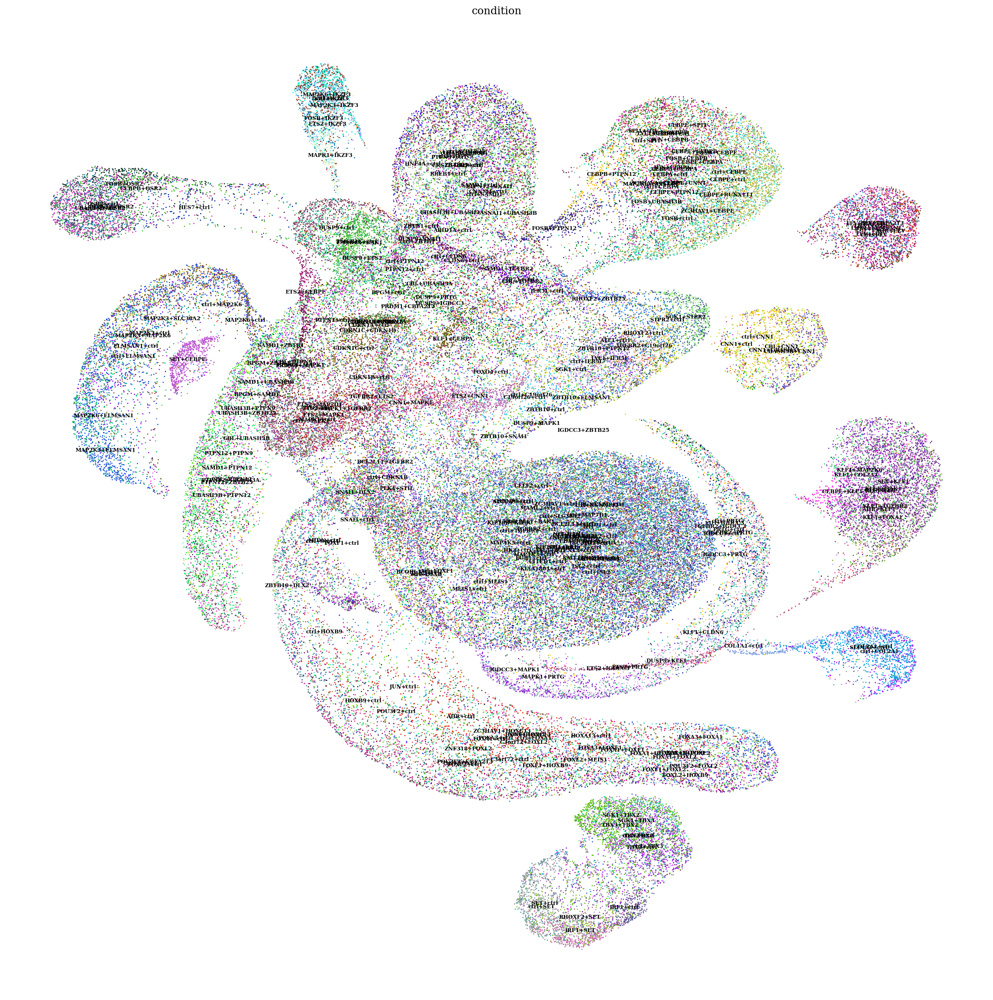

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

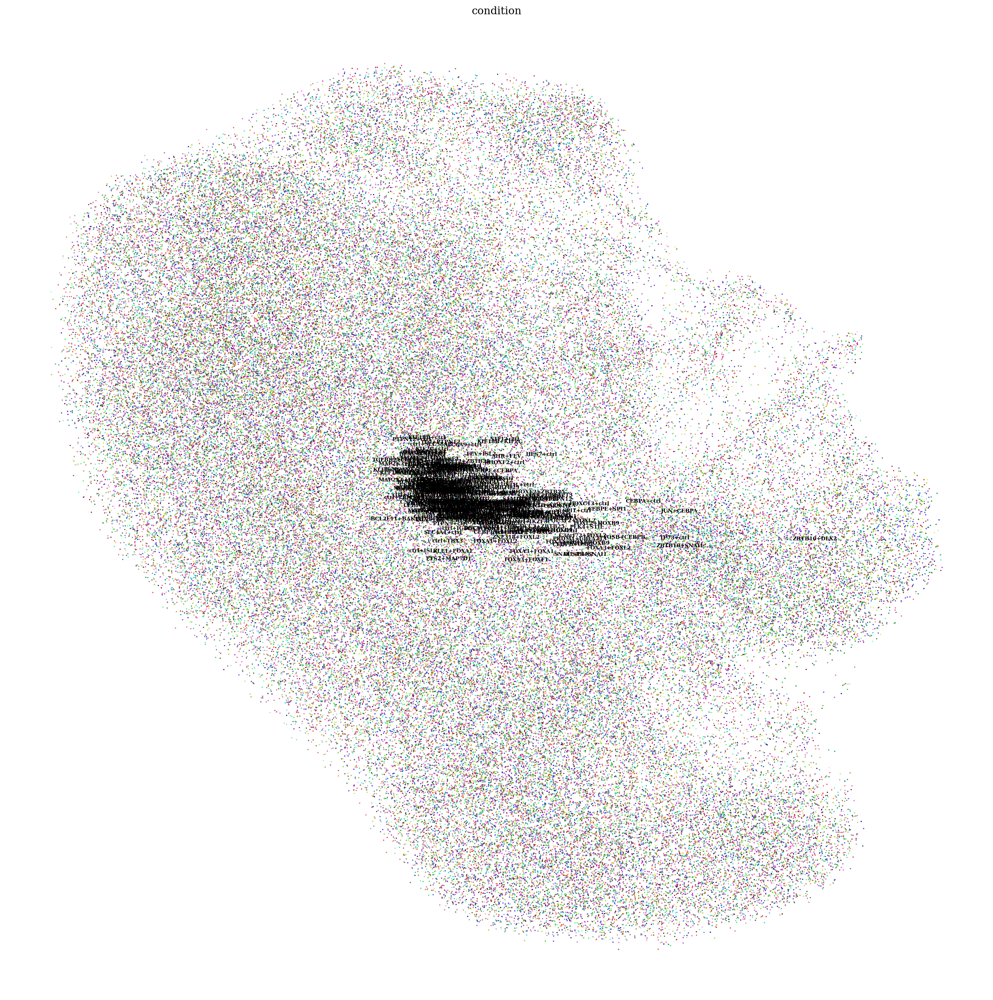

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()